In [2]:
import torch
import torchvision
import torch.nn as nn
import re
import os
import matplotlib.pyplot as plt

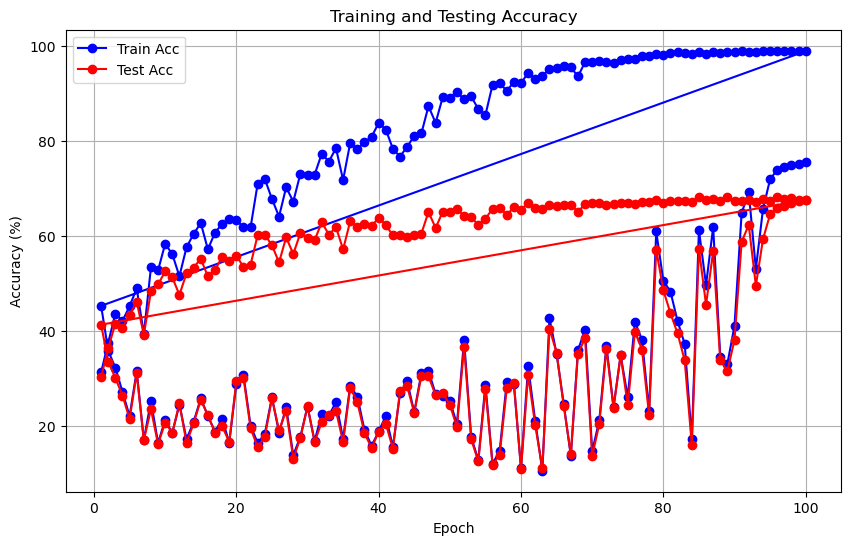

In [4]:
# Initialize lists to store train and test accuracies
epochs = []
train_accs = []
test_accs = []

# Path to your .out file
out_file = '/data/home/huq/MLHospital/log_sparse_train_only/resnet18_target_mia_pruned_l1_5_100100_clamp10000.out'

# Regular expression pattern to match the desired lines
pattern = r'Train Epoch: (\d+),.*Train Acc: ([\d\.]+), Test Acc: ([\d\.]+)'

# Read the .out file
with open(out_file, 'r') as file:
    for line in file:
        match = re.search(pattern, line)
        if match:
            epochs.append(int(match.group(1)))
            train_accs.append(float(match.group(2)))
            test_accs.append(float(match.group(3)))

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_accs, label='Train Acc', color='blue', marker='o')
plt.plot(epochs, test_accs, label='Test Acc', color='red', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Training and Testing Accuracy')
plt.legend()
plt.grid(True)
plt.show()


# Trade-off

In [2]:
import re

def extract_acc(file_path):
    """从densenet121_target.out文件中提取acc."""
    acc = None
    with open(file_path, 'r') as file:
        lines = [line.strip() for line in file if line.strip()]  # 过滤掉空行
        # 倒数第二行可能是我们需要的那一行
        match = re.search(r"Test Acc: (\d+\.\d+)", lines[-2])
        if match:
            acc = round(float(match.group(1)) / 100, 3)
    return acc

def extract_attack_acc(file_path, attack_type):
    """根据攻击方法，从相应的文件中提取attack acc."""
    attack_acc = None
    with open(file_path, 'r') as file:
        lines = [line.strip() for line in file if line.strip()]  # 过滤掉空行
        if attack_type == 'black-box':
            match = re.search(r"Overall Test Acc: (\d+\.\d+)", lines[-1])
            if match:
                attack_acc = round(float(match.group(1)) / 100, 3)
        elif attack_type in ['correct', 'confidence', 'entropy', 'modified entropy']:
            # 获取最后8行数据
            last_lines = lines[-8:]
            patterns = {
                'correct': r"correct test acc:(\d+\.\d+)",
                'confidence': r"confidence test acc:(\d+\.\d+)",
                'entropy': r"entropy test acc:(\d+\.\d+)",
                'modified entropy': r"modified entropy test acc:(\d+\.\d+)"
            }
            for line in last_lines:
                match = re.search(patterns[attack_type], line)
                if match:
                    attack_acc = round(float(match.group(1)), 3)
                    break
        elif attack_type in ['grid_w_l1', 'grid_w_l2', 'grid_w_Mean']:
            patterns = {
                'grid_w_l1': r"grid_w_l1_test acc:(\d+\.\d+)",
                'grid_w_l2': r"grid_w_l2_test acc:(\d+\.\d+)",
                'grid_w_Mean': r"grid_w_Mean_test acc:(\d+\.\d+)"
            }
            for line in lines:
                match = re.search(patterns[attack_type], line)
                if match:
                    attack_acc = round(float(match.group(1)), 3)
                    break
    return attack_acc


In [3]:
# model_name="densenet121"
model_name="resnet18"
def get_defense_results(base_dir, attack_type):
    """遍历目录获取所有防御方法及其超参数下的acc和attack acc."""
    results = {}
    for folder_name in os.listdir(base_dir):
        if os.path.isdir(os.path.join(base_dir, folder_name)):
            defense_method, hyperparam = folder_name.split('_')
            acc_file = os.path.join(base_dir, folder_name, f'{model_name}_target.out')
            acc = extract_acc(acc_file)
            attack_acc_file = None
            if attack_type == 'black-box':
                attack_acc_file = os.path.join(base_dir, folder_name, f'black-box_{model_name}.out')
            elif attack_type in ['correct', 'confidence', 'entropy', 'modified entropy']:
                attack_acc_file = os.path.join(base_dir, folder_name, f'metric-based_{model_name}.out')
            elif attack_type in ['grid_w_l1', 'grid_w_l2', 'grid_w_Mean']:
                attack_acc_file = os.path.join(base_dir, folder_name, f'white-box_{model_name}.out')
            
            attack_acc = extract_attack_acc(attack_acc_file, attack_type)
            
            if defense_method not in results:
                results[defense_method] = []
            results[defense_method].append((float(hyperparam), acc, attack_acc))
    
    # 按超参数从大到小排序
    for defense_method in results:
        results[defense_method].sort(reverse=True, key=lambda x: x[0])
    
    return results


In [4]:
# import matplotlib.pyplot as plt

# def plot_results(results, attack_type):
#     plt.figure(figsize=(10, 8))
    
#     for defense_method, data_points in results.items():
#         hyperparams, accs, attack_accs = zip(*data_points)
#         plt.plot(attack_accs, accs, marker='o', linestyle='-', label=defense_method)
    
#     plt.title(f'{attack_type.capitalize()} Attack - ACC vs. Attack ACC')
#     plt.xlabel('Attack ACC')
#     plt.ylabel('ACC')
#     plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=3)
#     plt.grid(True)
#     plt.show()


import matplotlib.pyplot as plt

def plot_all_results_as_subplots(results_dict):
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    
    # 攻击类型作为标题和轴的标签
    attack_types = ['black-box', 'correct', 'confidence', 'entropy', 'modified entropy', 'grid_w_l1', 'grid_w_l2', 'grid_w_Mean']
    
    # 逐个子图绘制每种攻击类型的结果
    for i, attack_type in enumerate(attack_types):
        row = i // 4
        col = i % 4
        ax = axs[row, col]
        
        results = results_dict.get(attack_type, {})
        all_accs = []
        all_attack_accs = []
        
        for defense_method, data_points in results.items():
            hyperparams, accs, attack_accs = zip(*data_points)
            all_accs.extend(accs)
            all_attack_accs.extend(attack_accs)
            ax.plot(accs, attack_accs, marker='o', linestyle='-', label=defense_method)
        
        ax.set_title(attack_type.capitalize())
        ax.grid(True)
        
        # 确保所有点都在图范围内并设置适当的边距
        if all_accs and all_attack_accs:
            x_min, x_max = min(all_accs), max(all_accs)
            y_min, y_max = min(all_attack_accs), max(all_attack_accs)
            
            # 根据数据范围设置轴范围，并增加一定边距
            x_margin = (x_max - x_min) * 0.05  # 5%的边距
            y_margin = (y_max - y_min) * 0.05  # 5%的边距
            ax.set_xlim(x_min - x_margin, x_max + x_margin)
            ax.set_ylim(y_min - y_margin, y_max + y_margin)
    
    # 设置x轴和y轴的标签
    for ax in axs[1, :]:  # 仅在第二行显示x轴标签
        ax.set_xlabel('ACC')
    for ax in axs[:, 0]:  # 仅在第一列显示y轴标签
        ax.set_ylabel('Attack ACC')
    
    # 公共图例
    handles, labels = axs[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=4)

    plt.tight_layout()
    plt.show()


{'black-box': {'CCL': [(0.9, 0.645, 0.613), (0.7, 0.647, 0.617), (0.5, 0.652, 0.605), (0.3, 0.657, 0.6), (0.1, 0.66, 0.561), (0.09, 0.661, 0.554), (0.07, 0.649, 0.552), (0.05, 0.659, 0.547), (0.03, 0.641, 0.526), (0.01, 0.61, 0.512)], 'AdvReg': [(500.0, 0.53, 0.502), (400.0, 0.451, 0.497), (300.0, 0.531, 0.508), (200.0, 0.638, 0.529), (100.0, 0.683, 0.652), (20.0, 0.68, 0.643), (10.0, 0.68, 0.636), (5.0, 0.685, 0.669), (2.0, 0.677, 0.662), (1.0, 0.672, 0.67)], 'RelaxLoss': [(2.0, 0.398, 0.504), (1.5, 0.545, 0.503), (1.0, 0.642, 0.514), (0.5, 0.668, 0.572), (0.1, 0.668, 0.636), (0.05, 0.674, 0.651)], 'MixupMMD': [(10.0, 0.658, 0.506), (5.0, 0.662, 0.517), (3.0, 0.671, 0.528), (1.0, 0.688, 0.552), (0.1, 0.684, 0.553), (0.01, 0.69, 0.562)], 'LabelSmoothing': [(0.8, 0.477, 0.501), (0.6, 0.603, 0.568), (0.5, 0.627, 0.599), (0.4, 0.639, 0.625), (0.2, 0.675, 0.649), (0.1, 0.667, 0.665), (0.05, 0.668, 0.672), (0.01, 0.672, 0.668), (0.005, 0.669, 0.665), (0.001, 0.673, 0.659)], 'Ours': [(5.0, 0

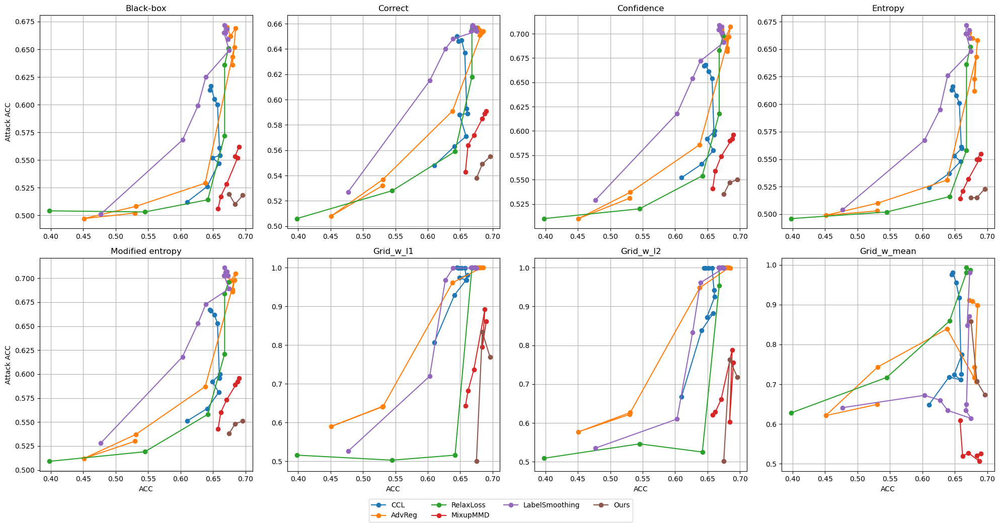

In [5]:
# def main(base_dir):
#     attack_types = ['black-box', 'correct', 'confidence', 'entropy', 'modified entropy', 'grid_w_l1', 'grid_w_l2', 'grid_w_Mean']
    
    # for attack_type in attack_types:
    #     results = get_defense_results(base_dir, attack_type)
#         plot_results(results, attack_type)

# # 使用该脚本时，指定你的日志文件的基目录
# base_dir = '/data/home/huq/MLHospital/log_defense_cifar100'
base_dir = '/data/home/huq/MLHospital/log_defense'
# main(base_dir)

# 假设results_dict已经通过之前的步骤生成
attack_types = ['black-box', 'correct', 'confidence', 'entropy', 'modified entropy', 'grid_w_l1', 'grid_w_l2', 'grid_w_Mean']
results_dict = {}
for attack_type in attack_types:
    results_dict[attack_type] = get_defense_results(base_dir, attack_type)
print(results_dict)
plot_all_results_as_subplots(results_dict)


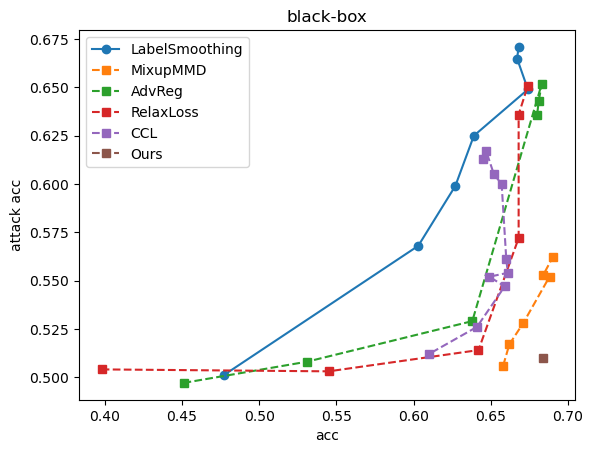

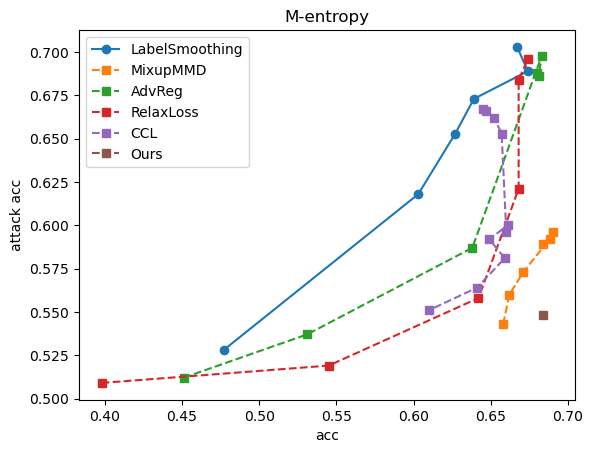

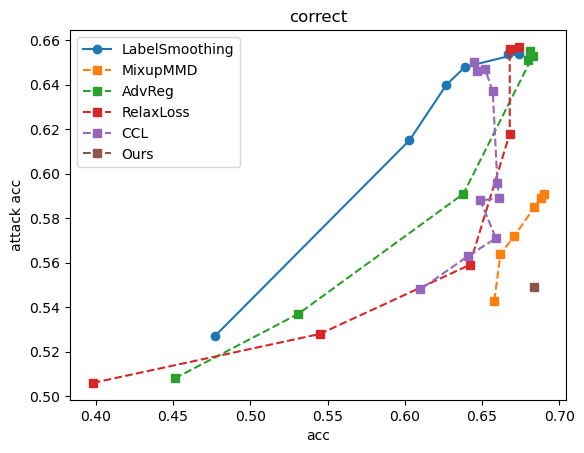

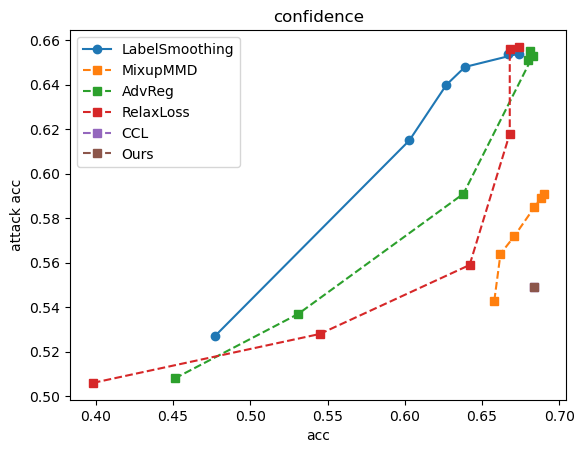

In [21]:
import matplotlib.pyplot as plt

# 给定的多个list，每个元素是一个二维坐标
points1 = [(0.477, 0.501),(0.603,0.568),(0.627,0.599),(0.639,0.625),(0.674,0.649), (0.667, 0.665), (0.668,0.671)]
points2 = [(0.658, 0.506), (0.662, 0.517), (0.671, 0.528), (0.688, 0.552), (0.684, 0.553),(0.690,0.562)]
points3 = [(0.451,0.497),(0.531,0.508),(0.638,0.529),(0.683, 0.652), (0.681, 0.643), (0.680, 0.636)]
points4 = [(0.398, 0.504), (0.545,0.503), (0.642, 0.514), (0.668, 0.572), (0.668, 0.636),(0.674,0.651)]
points5 = [(0.645, 0.613), (0.647,0.617), (0.652, 0.605), (0.657, 0.600), (0.660, 0.561),(0.661,0.554),(0.649,0.552),(0.659,0.547),(0.641,0.526),(0.610,0.512)]
points = [(0.684, 0.510)]

# 将x和y坐标分开
x1, y1 = zip(*points1)
x2, y2 = zip(*points2)
x3, y3 = zip(*points3)
x4, y4 = zip(*points4)
x5, y5 = zip(*points5)
x, y = zip(*points)

# 画图
plt.plot(x1, y1, marker='o', linestyle='-', label='LabelSmoothing')
plt.plot(x2, y2, marker='s', linestyle='--', label='MixupMMD')
plt.plot(x3, y3, marker='s', linestyle='--', label='AdvReg')
plt.plot(x4, y4, marker='s', linestyle='--', label='RelaxLoss')
plt.plot(x5, y5, marker='s', linestyle='--', label='CCL')
plt.plot(x, y, marker='s', linestyle='--', label='Ours')

# 添加标题和标签
plt.title('black-box')
plt.xlabel('acc')
plt.ylabel('attack acc')

# 显示图例
plt.legend()

# 显示图形
plt.show()

################################

# 给定的多个list，每个元素是一个二维坐标
points1 = [(0.477, 0.528),(0.603,0.618),(0.627,0.653),(0.639,0.673),(0.674,0.689), (0.667, 0.703)]
points2 = [(0.658, 0.543), (0.662, 0.560), (0.671, 0.573), (0.688, 0.592), (0.684, 0.589),(0.690,0.596)]
points3 = [(0.451,0.512),(0.531,0.537),(0.638,0.587),(0.683, 0.698), (0.681, 0.686), (0.680, 0.688)]
points4 = [(0.398, 0.509), (0.545,0.519), (0.642, 0.558), (0.668, 0.621), (0.668, 0.684),(0.674,0.696)]
points5 = [(0.645, 0.667), (0.647,0.666), (0.652, 0.662), (0.657, 0.653), (0.660, 0.596),(0.661,0.600),(0.649,0.592),(0.659,0.581),(0.641,0.564),(0.610,0.551)]
points = [(0.684, 0.548)]

# 将x和y坐标分开
x1, y1 = zip(*points1)
x2, y2 = zip(*points2)
x3, y3 = zip(*points3)
x4, y4 = zip(*points4)
x5, y5 = zip(*points5)
x, y = zip(*points)

# 画图
plt.plot(x1, y1, marker='o', linestyle='-', label='LabelSmoothing')
plt.plot(x2, y2, marker='s', linestyle='--', label='MixupMMD')
plt.plot(x3, y3, marker='s', linestyle='--', label='AdvReg')
plt.plot(x4, y4, marker='s', linestyle='--', label='RelaxLoss')
plt.plot(x5, y5, marker='s', linestyle='--', label='CCL')
plt.plot(x, y, marker='s', linestyle='--', label='Ours')

# 添加标题和标签
plt.title('M-entropy')
plt.xlabel('acc')
plt.ylabel('attack acc')

# 显示图例
plt.legend()

# 显示图形
plt.show()
###############################
# 给定的多个list，每个元素是一个二维坐标
points1 = [(0.477, 0.527),(0.603,0.615),(0.627,0.640),(0.639,0.648),(0.674,0.654), (0.667, 0.654)]
points2 = [(0.658, 0.543), (0.662, 0.564), (0.671, 0.572), (0.688, 0.589), (0.684, 0.585),(0.690,0.591)]
points3 = [(0.451,0.508),(0.531,0.537),(0.638,0.591),(0.683, 0.653), (0.681, 0.655), (0.680, 0.651)]
points4 = [(0.398, 0.506), (0.545,0.528), (0.642, 0.559), (0.668, 0.618), (0.668, 0.656),(0.674,0.657)]
points5 = [(0.645, 0.650), (0.647,0.646), (0.652, 0.647), (0.657, 0.637), (0.660, 0.596),(0.661,0.589),(0.649,0.588),(0.659,0.571),(0.641,0.563),(0.610,0.548)]
points = [(0.684, 0.549)]

# 将x和y坐标分开
x1, y1 = zip(*points1)
x2, y2 = zip(*points2)
x3, y3 = zip(*points3)
x4, y4 = zip(*points4)
x5, y5 = zip(*points5)
x, y = zip(*points)

# 画图
plt.plot(x1, y1, marker='o', linestyle='-', label='LabelSmoothing')
plt.plot(x2, y2, marker='s', linestyle='--', label='MixupMMD')
plt.plot(x3, y3, marker='s', linestyle='--', label='AdvReg')
plt.plot(x4, y4, marker='s', linestyle='--', label='RelaxLoss')
plt.plot(x5, y5, marker='s', linestyle='--', label='CCL')
plt.plot(x, y, marker='s', linestyle='--', label='Ours')

# 添加标题和标签
plt.title('correct')
plt.xlabel('acc')
plt.ylabel('attack acc')

# 显示图例
plt.legend()

# 显示图形
plt.show()
#################################
# 给定的多个list，每个元素是一个二维坐标
points1 = [(0.477, 0.527),(0.603,0.615),(0.627,0.640),(0.639,0.648),(0.674,0.654), (0.667, 0.654)]
points2 = [(0.658, 0.543), (0.662, 0.564), (0.671, 0.572), (0.688, 0.589), (0.684, 0.585),(0.690,0.591)]
points3 = [(0.451,0.508),(0.531,0.537),(0.638,0.591),(0.683, 0.653), (0.681, 0.655), (0.680, 0.651)]
points4 = [(0.398, 0.506), (0.545,0.528), (0.642, 0.559), (0.668, 0.618), (0.668, 0.656),(0.674,0.657)]
points5 = [(0.645, 0.613), (0.647,0.617), (0.652, 0.605), (0.657, 0.600), (0.660, 0.561),(0.661,0.554),(0.649,0.552),(0.659,0.547),(0.641,0.526),(0.610,0.512)]
points = [(0.684, 0.549)]

# 将x和y坐标分开
x1, y1 = zip(*points1)
x2, y2 = zip(*points2)
x3, y3 = zip(*points3)
x4, y4 = zip(*points4)
x5, y5 = zip(*points5)
x, y = zip(*points)

# 画图
plt.plot(x1, y1, marker='o', linestyle='-', label='LabelSmoothing')
plt.plot(x2, y2, marker='s', linestyle='--', label='MixupMMD')
plt.plot(x3, y3, marker='s', linestyle='--', label='AdvReg')
plt.plot(x4, y4, marker='s', linestyle='--', label='RelaxLoss')
plt.plot(x5, y5, marker='s', linestyle='--', label='CCL')
plt.plot(x, y, marker='s', linestyle='--', label='Ours')

# 添加标题和标签
plt.title('confidence')
plt.xlabel('acc')
plt.ylabel('attack acc')

# 显示图例
plt.legend()

# 显示图形
plt.show()

# Grad Gap Variations

In [7]:
model = torchvision.models.densenet121()
# model.classifier = nn.Sequential(nn.Linear(1024, 100))

# print(model)
for name, param in model.named_parameters():
    print(name, param.dtype)

features.conv0.weight torch.float32
features.norm0.weight torch.float32
features.norm0.bias torch.float32
features.denseblock1.denselayer1.norm1.weight torch.float32
features.denseblock1.denselayer1.norm1.bias torch.float32
features.denseblock1.denselayer1.conv1.weight torch.float32
features.denseblock1.denselayer1.norm2.weight torch.float32
features.denseblock1.denselayer1.norm2.bias torch.float32
features.denseblock1.denselayer1.conv2.weight torch.float32
features.denseblock1.denselayer2.norm1.weight torch.float32
features.denseblock1.denselayer2.norm1.bias torch.float32
features.denseblock1.denselayer2.conv1.weight torch.float32
features.denseblock1.denselayer2.norm2.weight torch.float32
features.denseblock1.denselayer2.norm2.bias torch.float32
features.denseblock1.denselayer2.conv2.weight torch.float32
features.denseblock1.denselayer3.norm1.weight torch.float32
features.denseblock1.denselayer3.norm1.bias torch.float32
features.denseblock1.denselayer3.conv1.weight torch.float32
feat

In [3]:
%load_ext autoreload
%autoreload 2

In [6]:
import sys
import os
current_dir = os.getcwd()
sys.path.append(os.path.abspath(os.path.join(current_dir, '../..')))
from mlh.defenses.membership_inference.Normal import TrainTargetNormal
from mlh.data_preprocessing.data_loader import GetDataLoader
import numpy as np
import torch_pruning as tp
from mlh.defenses.membership_inference.pruner import MIAImportance, GradGapPruner
import argparse
torch.manual_seed(0)
np.random.seed(0)
torch.set_num_threads(1)

args = argparse.Namespace(
    dataset='CIFAR100',
    model='dense121',
    data_path='../datasets/',
    log_path='./save',
    input_shape="32,32,3",
    reg_norm="l2",
    reg_alpha=0.63,
    reg_clamp=10000,
    reg_epoch=20,
    reg_weight=0.01
)
args.input_shape = [int(item) for item in args.input_shape.split(',')]

# 初始化模型、损失函数等
s = GetDataLoader(args)
target_train_loader, target_inference_loader, target_test_loader, shadow_train_loader, shadow_inference_loader, shadow_test_loader = s.get_data_supervised()
# member_loader,nonmember_loader=target_train_loader, target_inference_loader
target_model=torch.load(f'/data/home/huq/MLHospital/mlh/examples/save/CIFAR10/Reg-0.001-10050-10000-l2_4.0/target/resnet18_model.pth')
# save_pth='/data/home/huq/MLHospital/mlh/examples/save/CIFAR100/Reg-0.01-10020-10000-l2_0.63/shadow'
####################
# example_inputs = torch.randn(1, 3, 32, 32).to('cuda')
# imp = tp.importance.GroupNormImportance(p=1)
# ignored_layers = []
# for m in target_model.modules():
#     if isinstance(m, torch.nn.Linear) and m.out_features == 10:
#         ignored_layers.append(m) # DO NOT prune the final classifier!

# pruner = GradGapPruner( # We can always choose MetaPruner if sparse training is not required.
#     target_model,
#     example_inputs,
#     importance=imp,
#     global_pruning=False,
#     pruning_ratio=0.5, # remove 50% channels, ResNet18 = {64, 128, 256, 512} => ResNet18_Half = {32, 64, 128, 256}
#     # pruning_ratio_dict = {model.conv1: 0.2, model.layer2: 0.8}, # customized pruning ratios for layers or blocks
#     ignored_layers=ignored_layers,
# )
# ####################
# total_evaluator = TrainTargetNormal(
#     model=target_model, epochs=args.reg_epoch, log_path=save_pth,learning_rate=0.01)
# total_evaluator.train_sparse(target_train_loader, target_inference_loader, target_test_loader,pruner=pruner,args=args)
# # total_evaluator.train(target_train_loader, target_test_loader)

# # if torch.isnan(labels).any() or torch.isnan(outputs).any():
# #     print("NaN detected in labels or outputs!")

add simple data augmentation!
add simple data augmentation!
Files already downloaded and verified
Files already downloaded and verified
Preparing dataloader!
dataset:  60000
target_train: 10000 	 target_inference: 10000 	 target_test: 10000


In [7]:
import torch

def check_nan_in_params(model):
    for name, param in model.named_parameters():
        if torch.isnan(param).any():
            print(f"NaN found in parameter: {name}")

# 在训练过程中的某个点调用
check_nan_in_params(target_model)

In [32]:
def get_target_model(name="resnet18", num_classes=10):
    if name == "resnet18":
        model = torchvision.models.resnet18()
        model.fc = nn.Sequential(nn.Linear(512, 10))
    else:
        raise ValueError("Model not implemented yet :P")
    return model

target_model = get_target_model(name="resnet18", num_classes=10).cuda()
print(target_model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

1.0


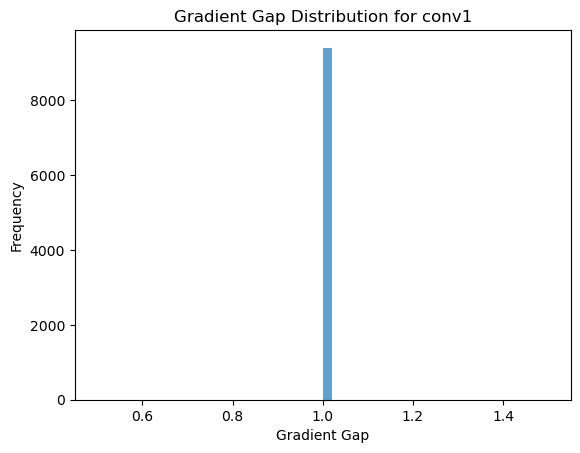

1.0


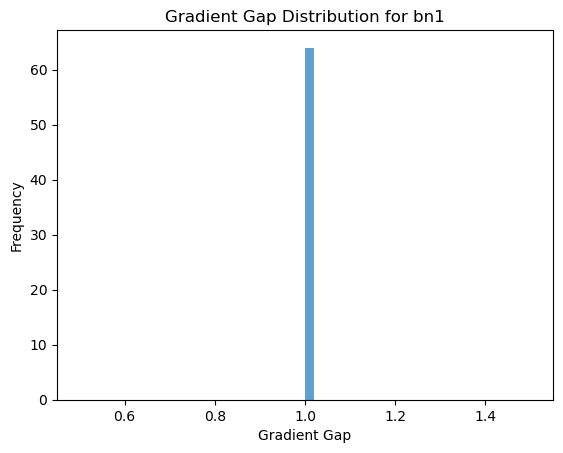

1.0


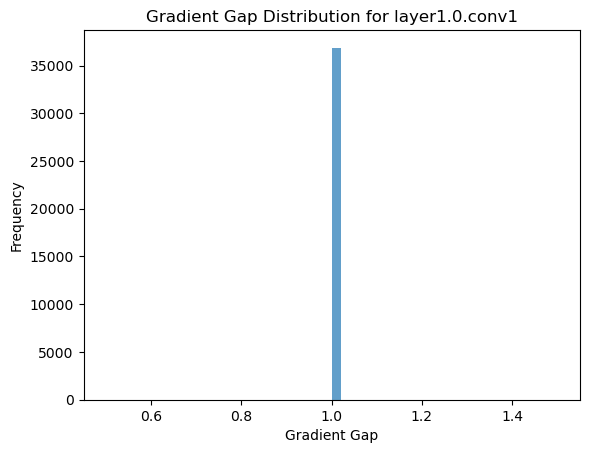

1.0


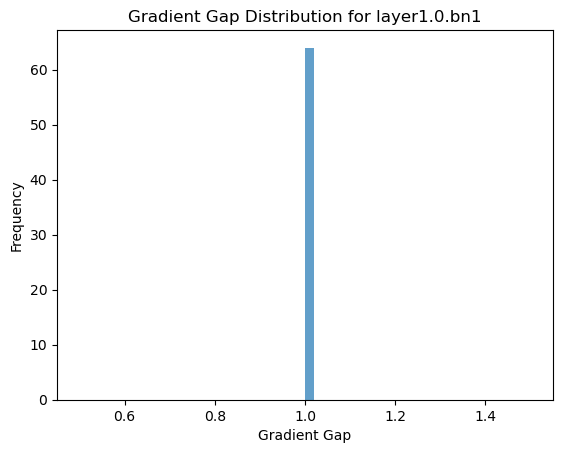

1.0


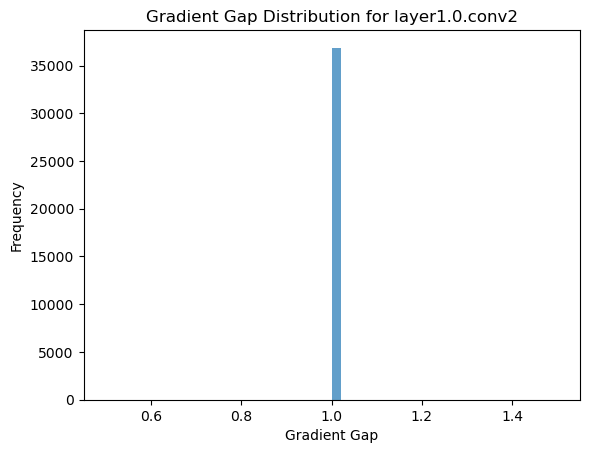

1.0


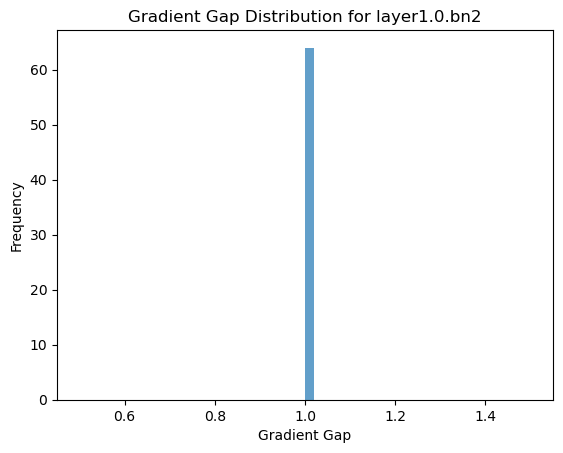

1.0


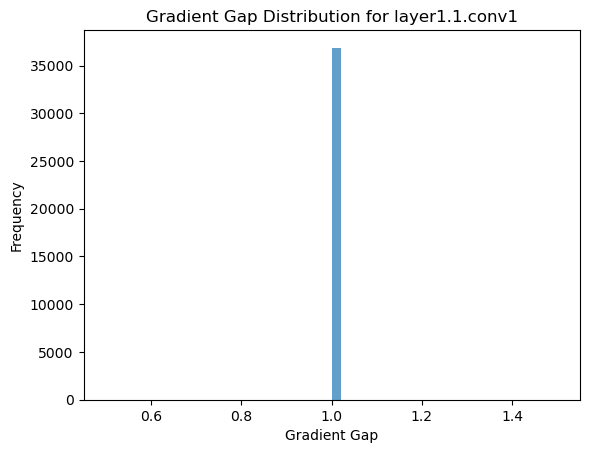

1.0


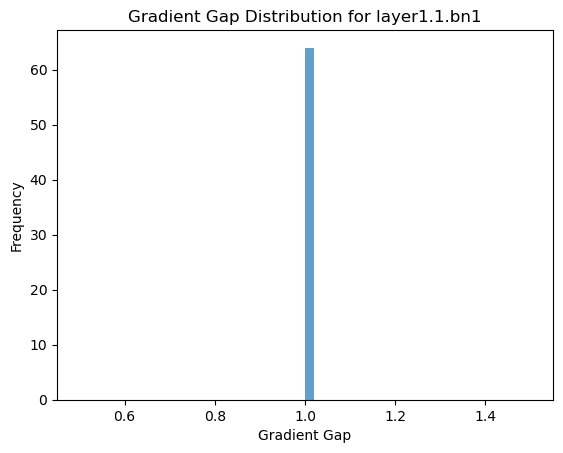

1.0


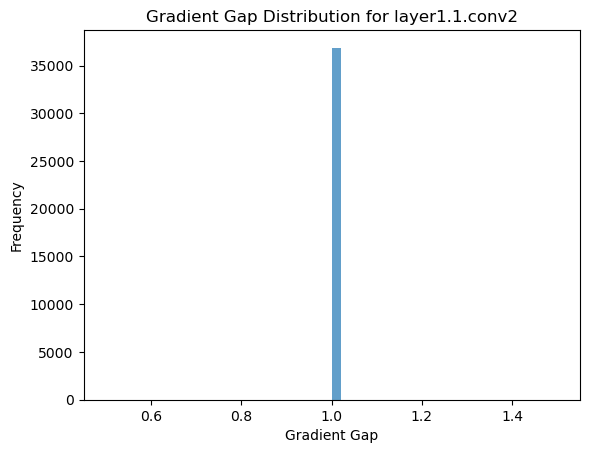

1.0


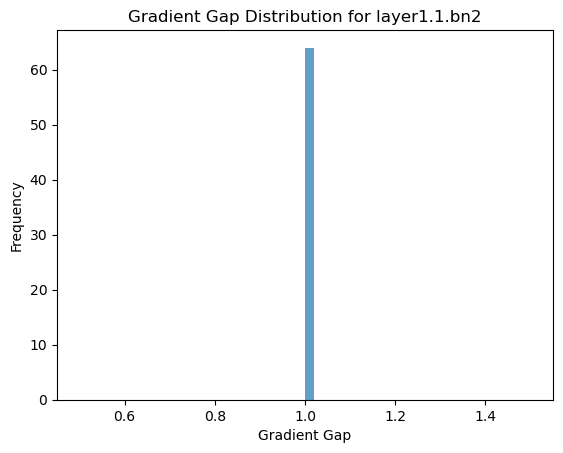

1.0


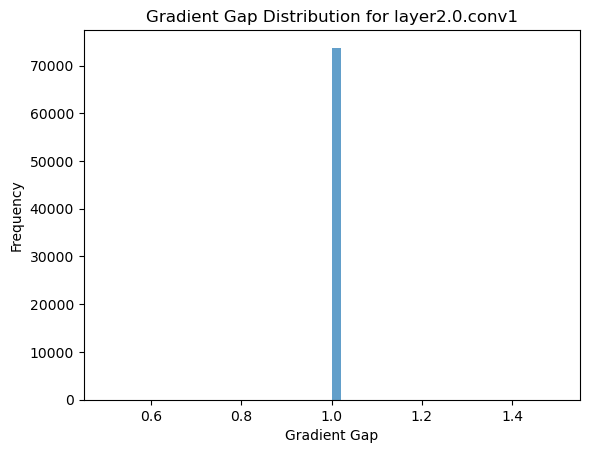

1.0


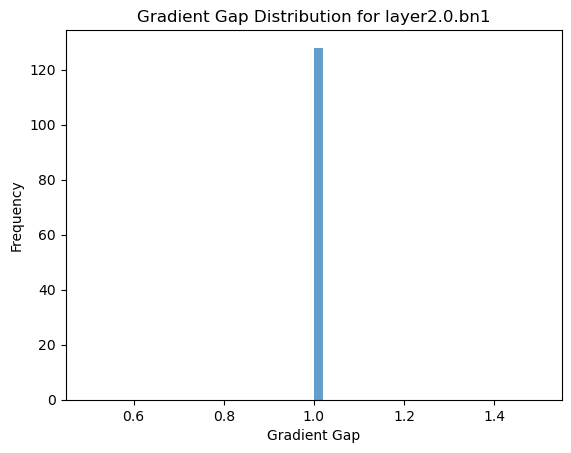

1.0


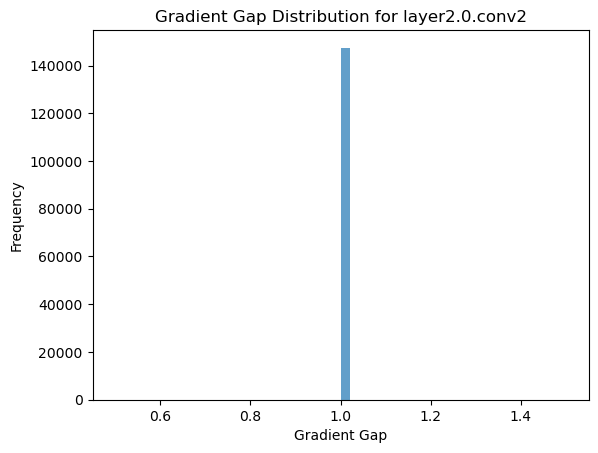

1.0


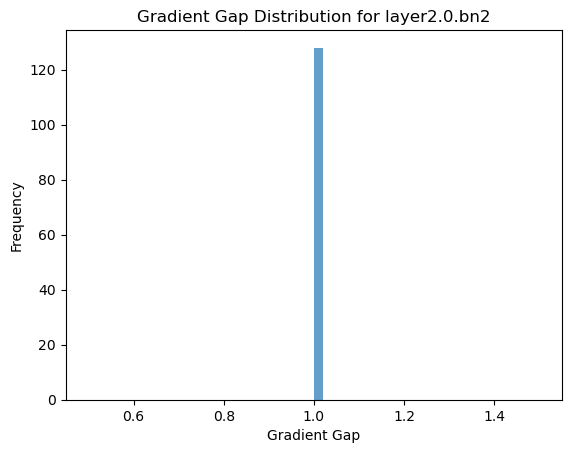

1.0


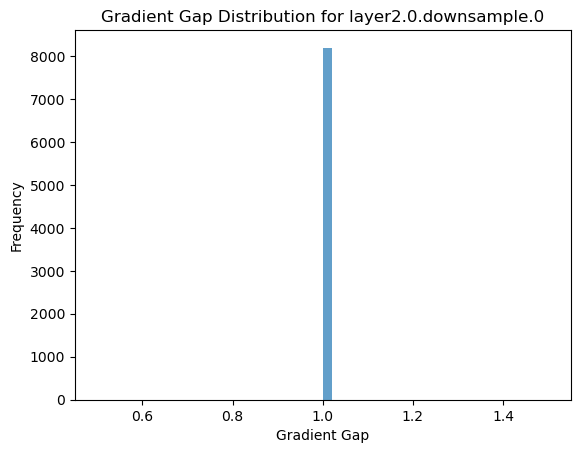

1.0


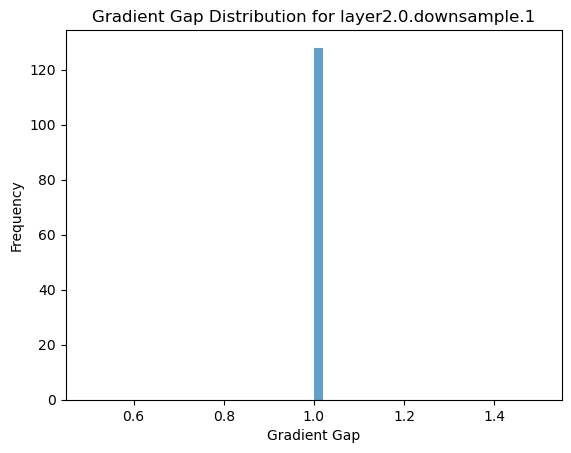

1.0


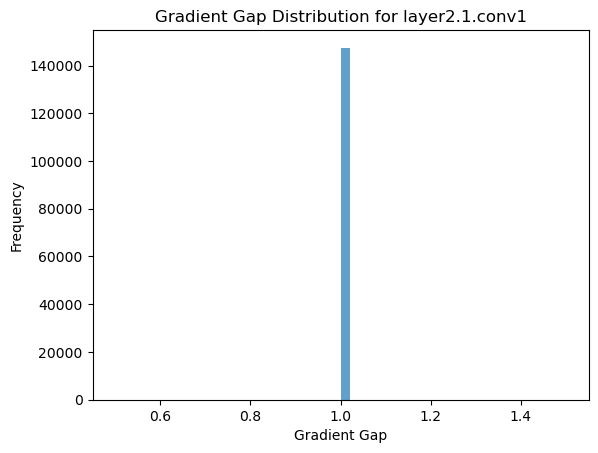

1.0


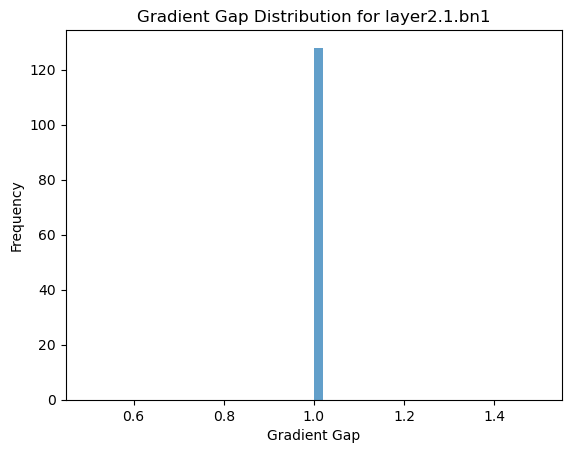

1.0


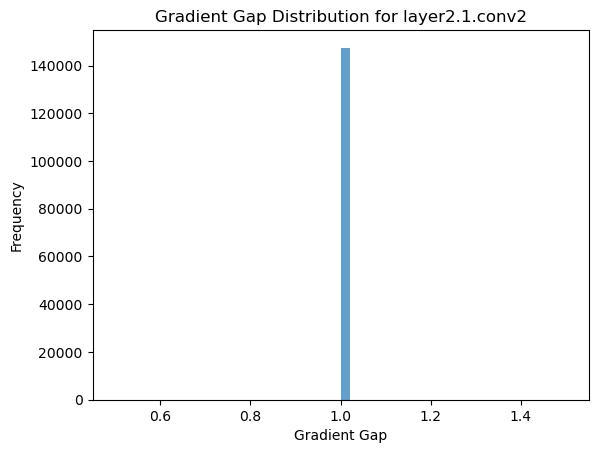

1.0


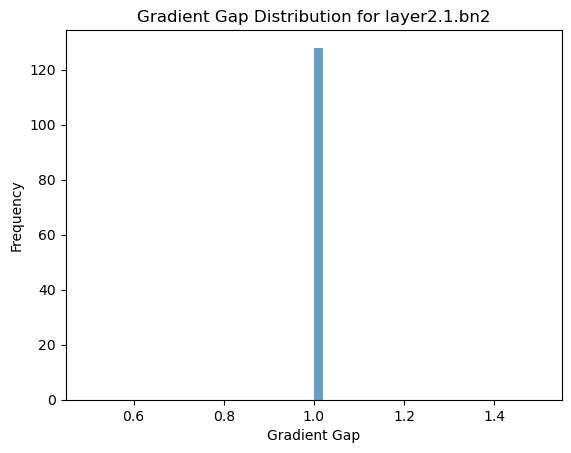

1.0


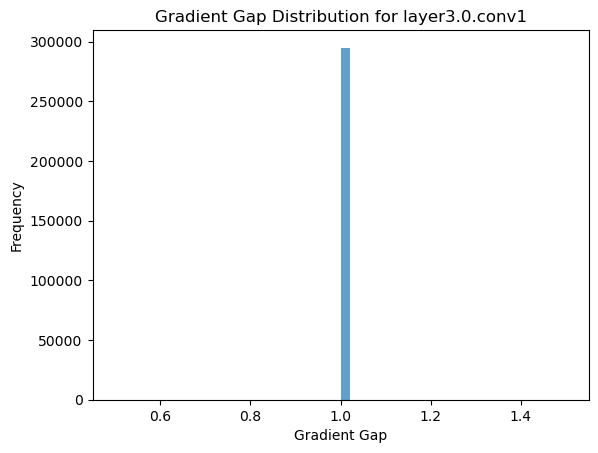

1.0


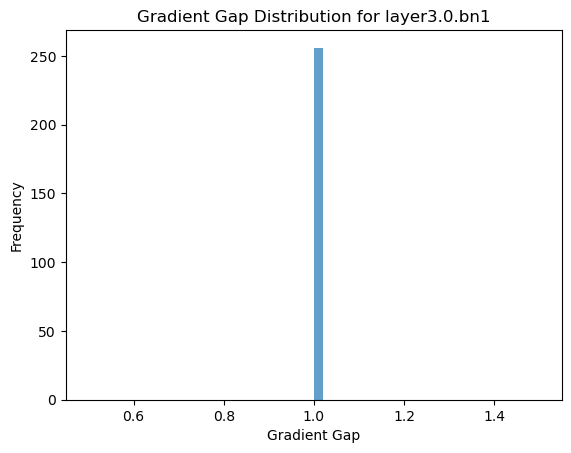

1.0


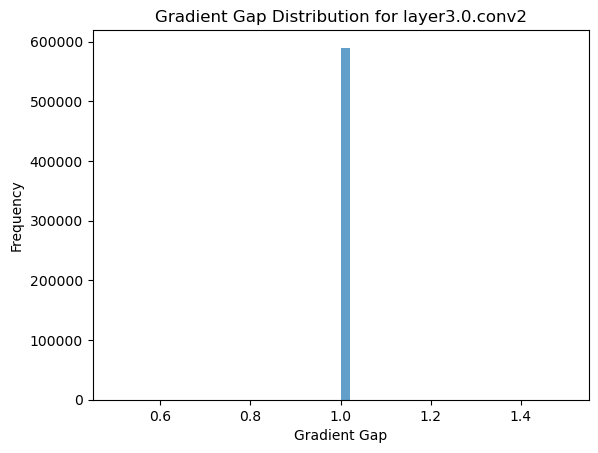

1.0


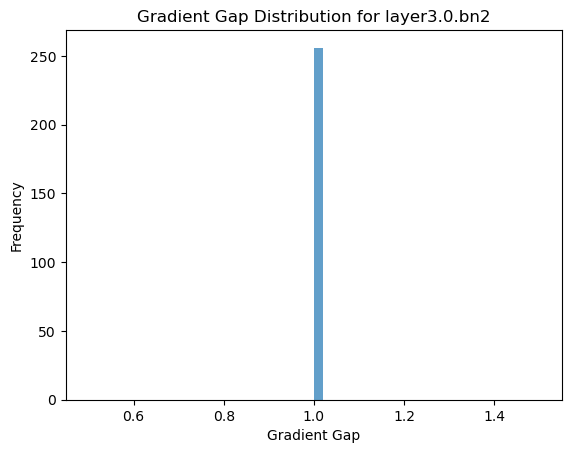

1.0


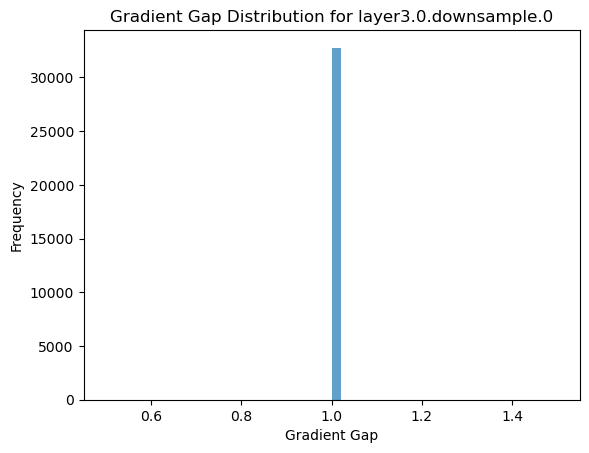

1.0


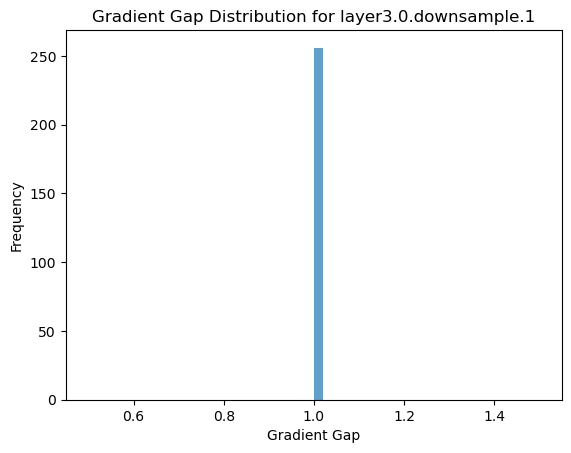

1.0


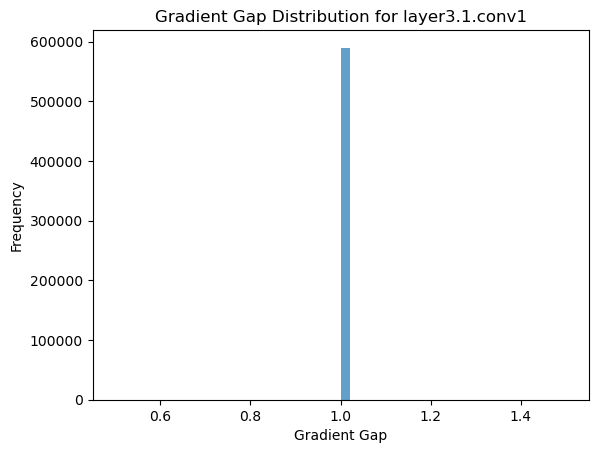

1.0


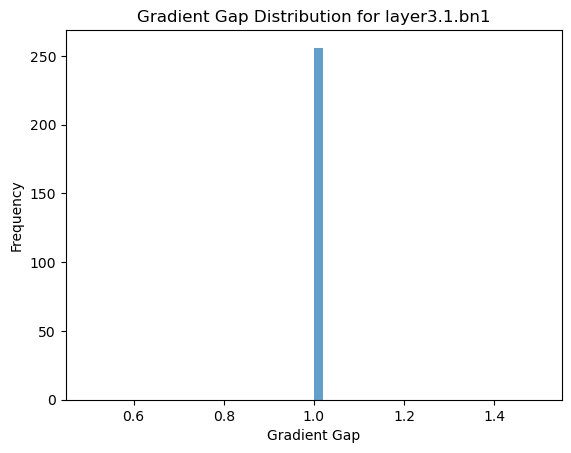

1.0


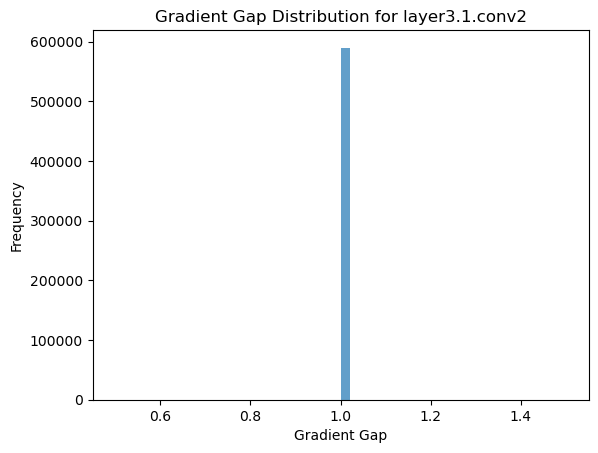

1.0


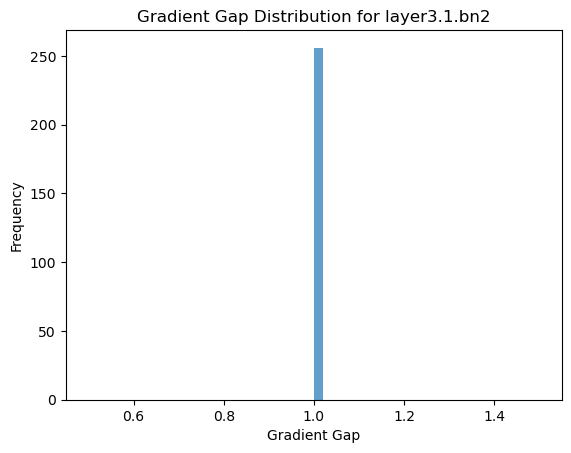

1.0


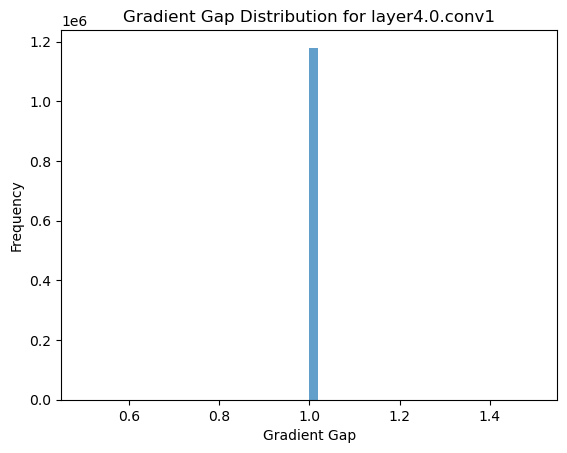

1.0


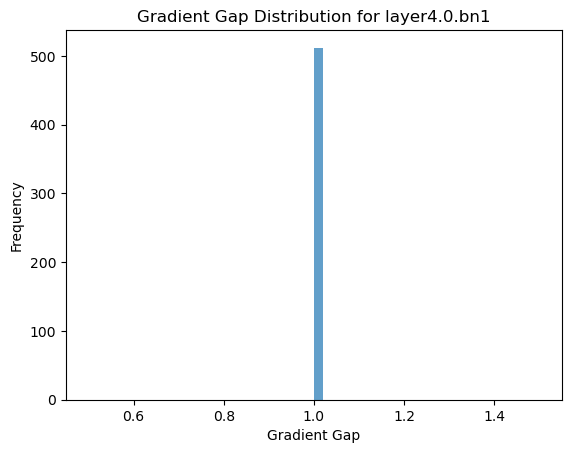

1.0


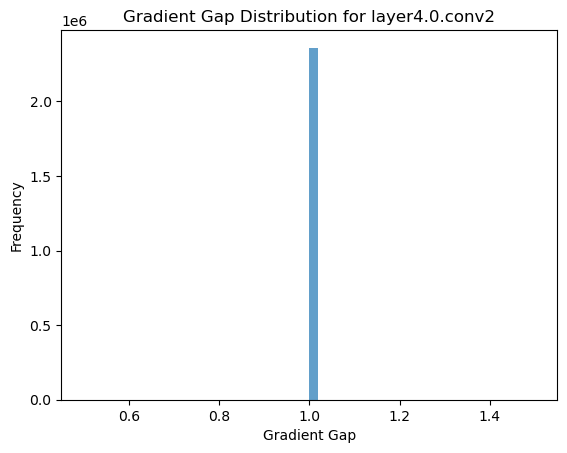

1.0


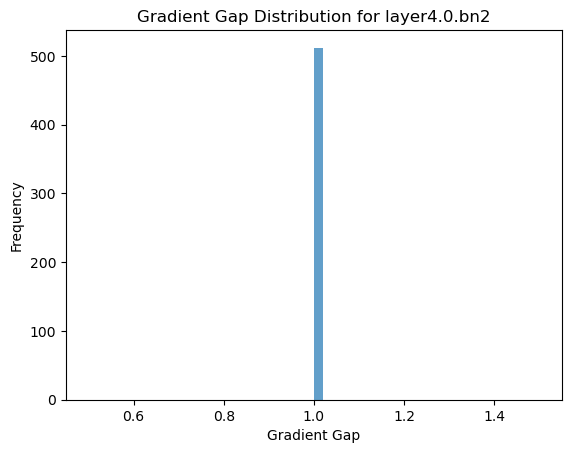

1.0


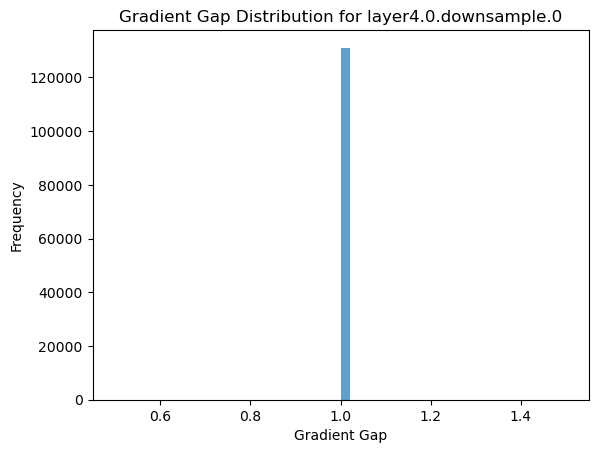

1.0


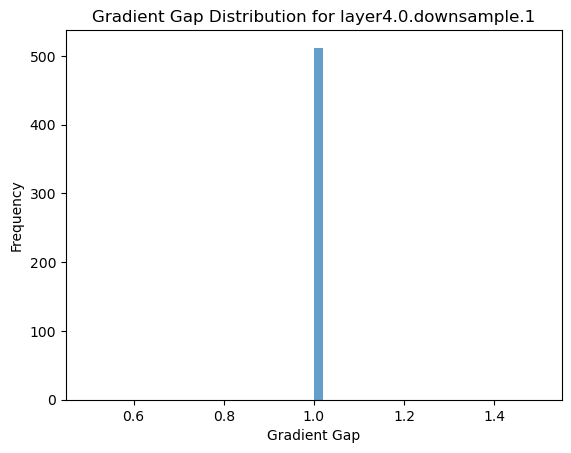

1.0


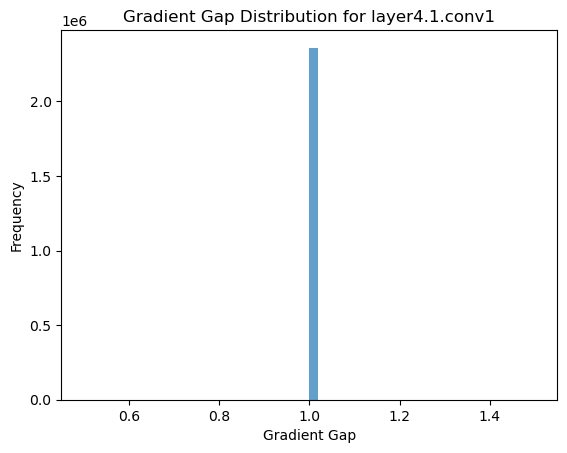

1.0


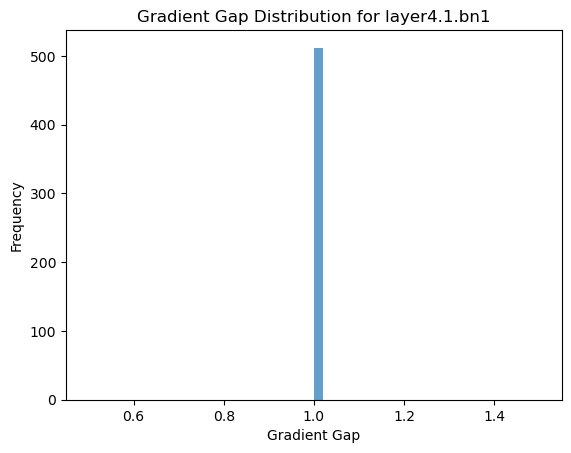

1.0


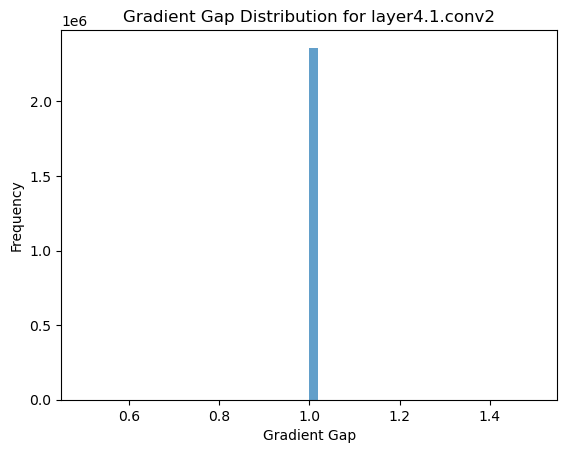

1.0


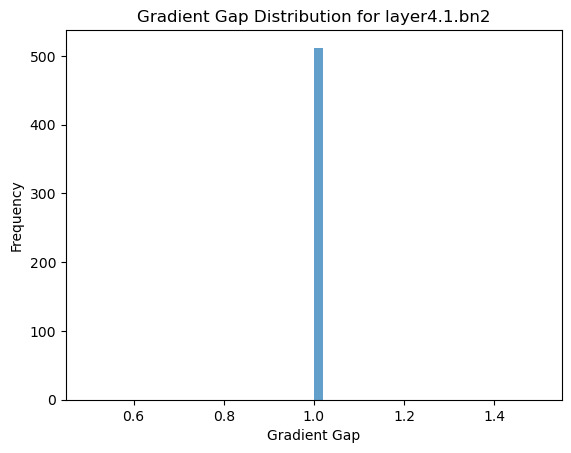

1.0


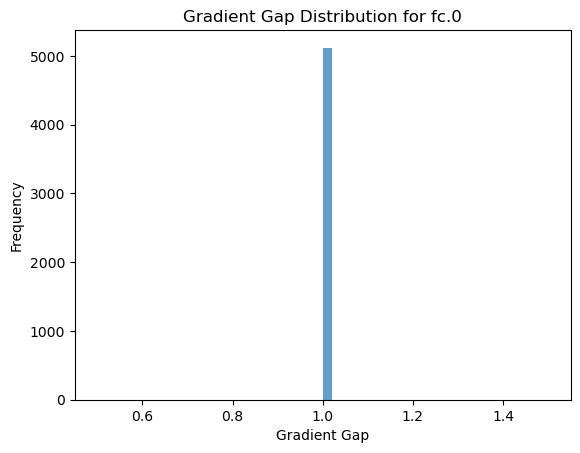

In [37]:
loaded_grad_gaps = torch.load('/data/home/huq/MLHospital/log_distribution/adaptive_regs/adaptive_regs_5_10.pth')

for name, grad_gap in loaded_grad_gaps.items():
    grad_gap_values = grad_gap.cpu().numpy().flatten()/1e-5  # 转为 numpy 数组并展平
    print(grad_gap_values.mean())
    plt.hist(grad_gap_values, bins=50, alpha=0.7)
    plt.title(f'Gradient Gap Distribution for {name}')
    plt.xlabel('Gradient Gap')
    plt.ylabel('Frequency')
    plt.show()

1.0


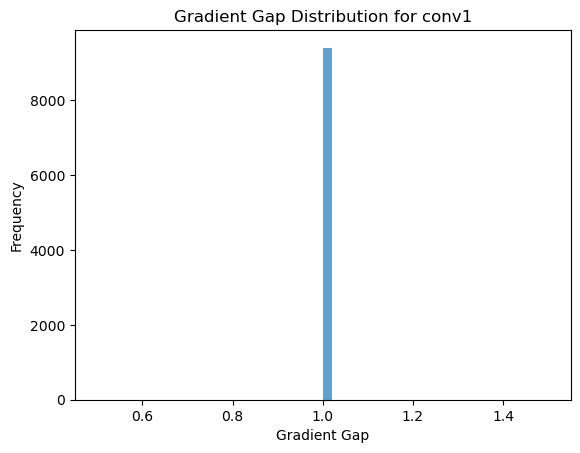

1.0


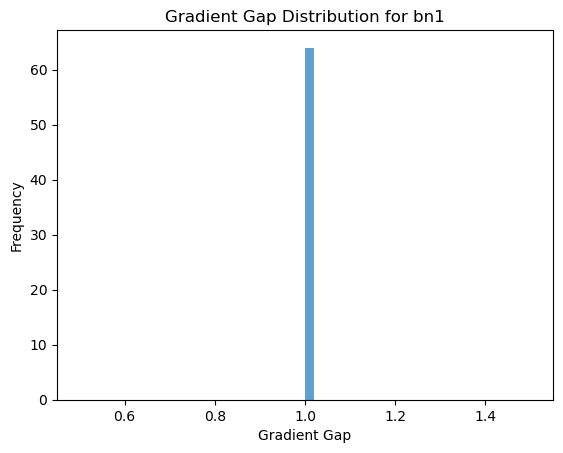

1.0


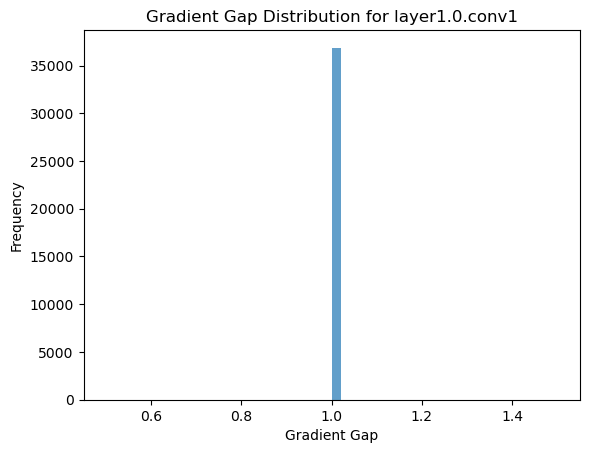

1.0


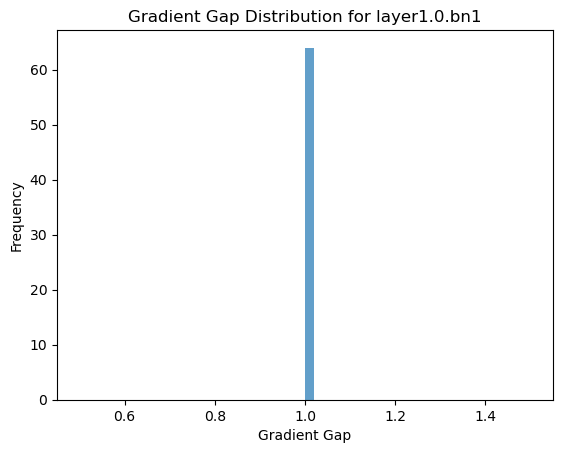

1.0


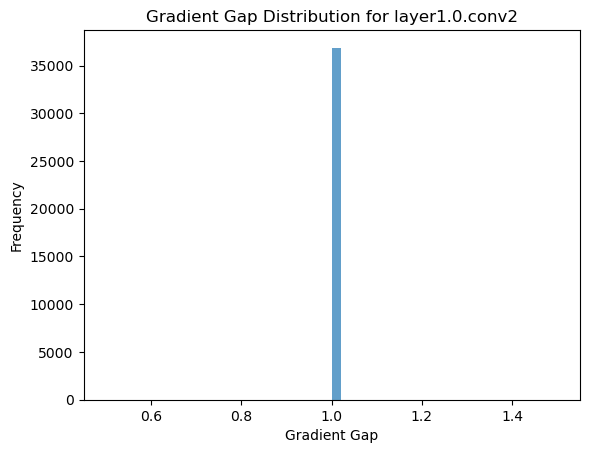

1.0


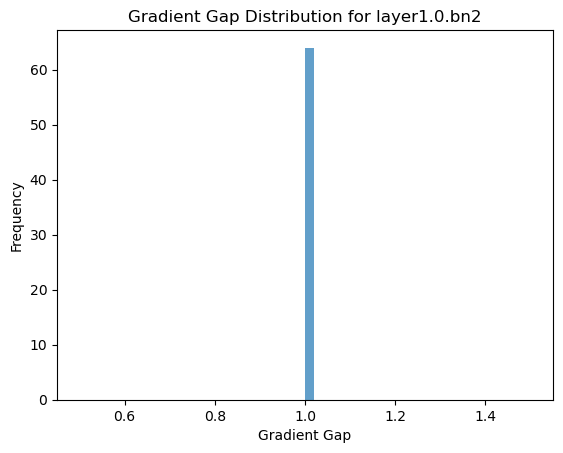

1.0


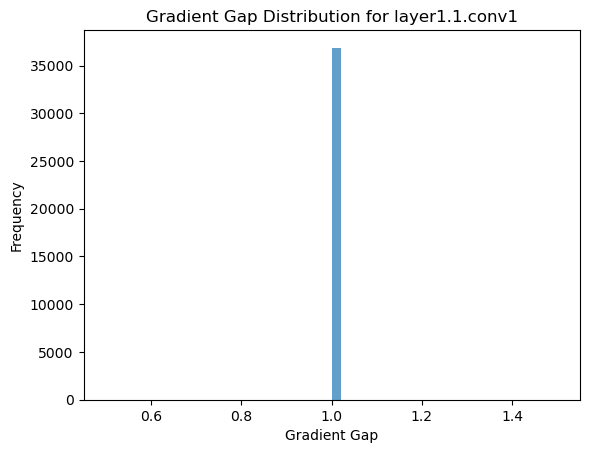

1.0


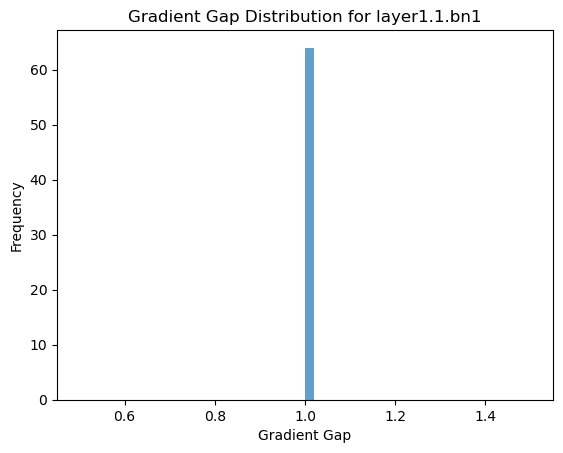

1.0


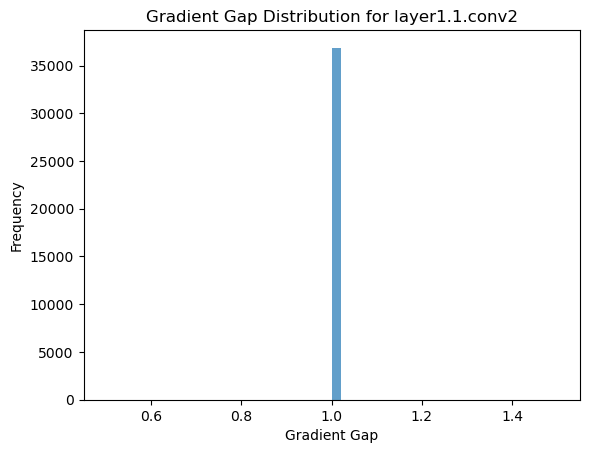

1.0


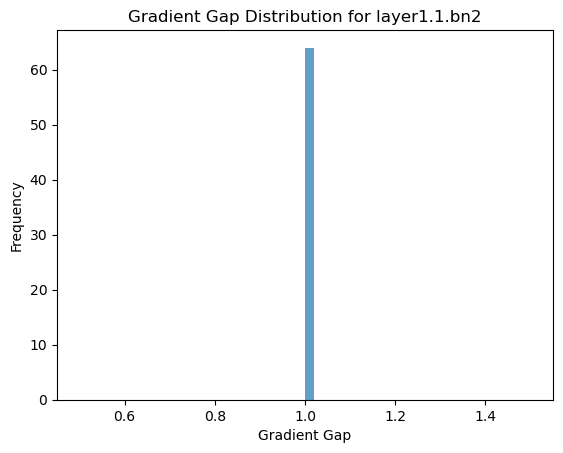

1.0


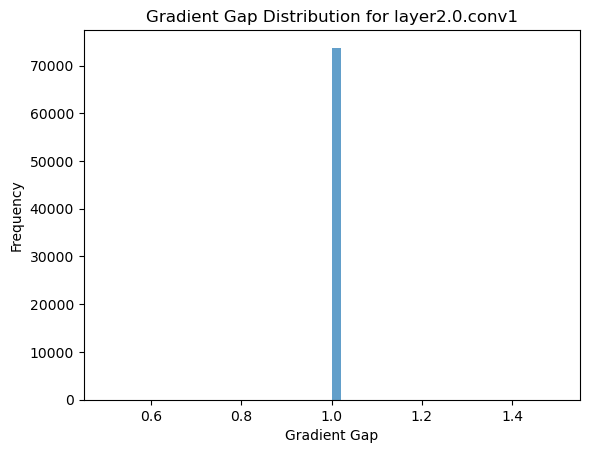

1.0


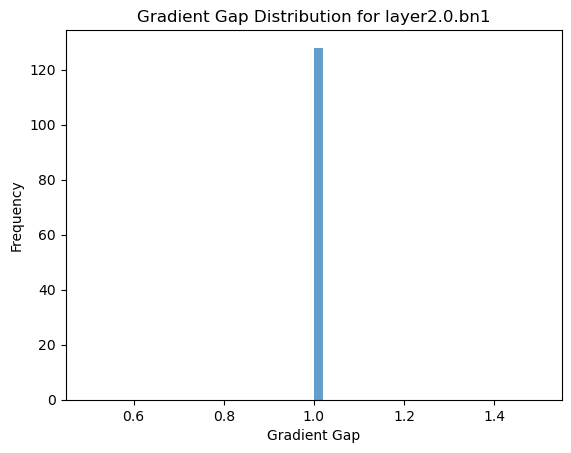

1.0


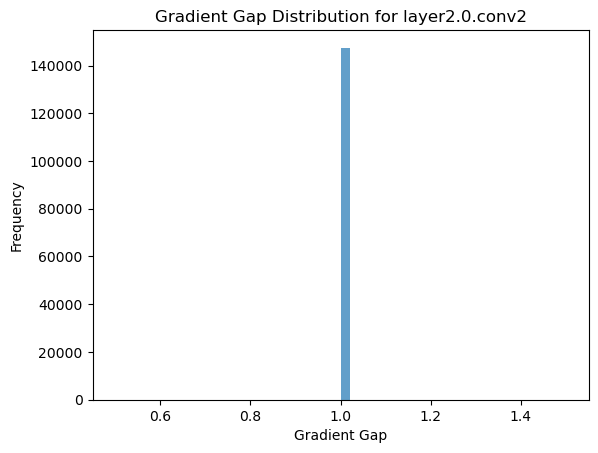

1.0


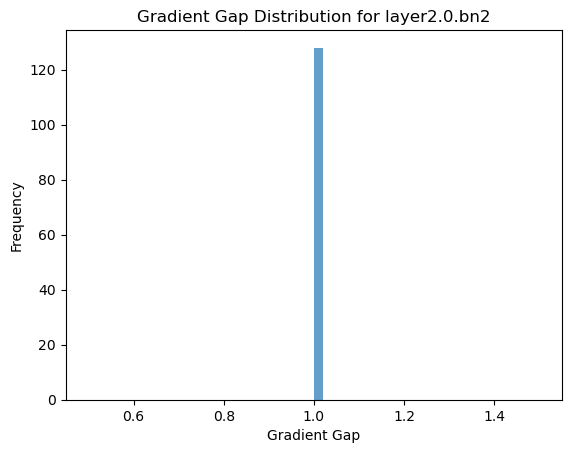

1.0


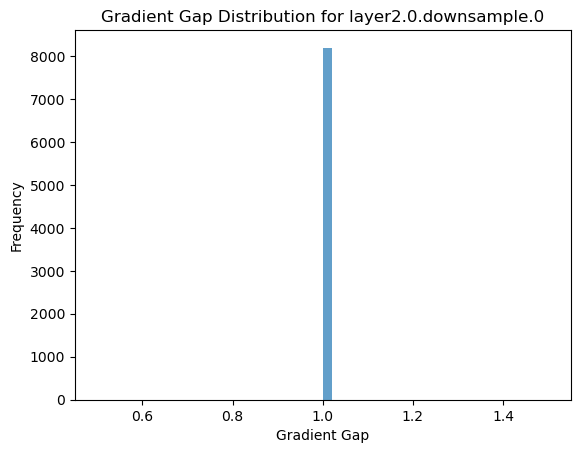

1.0


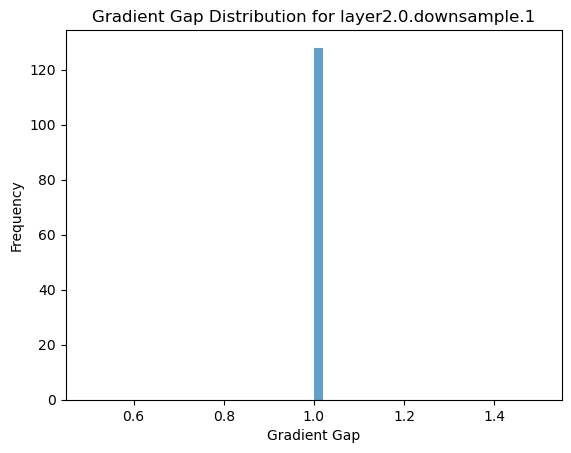

1.0


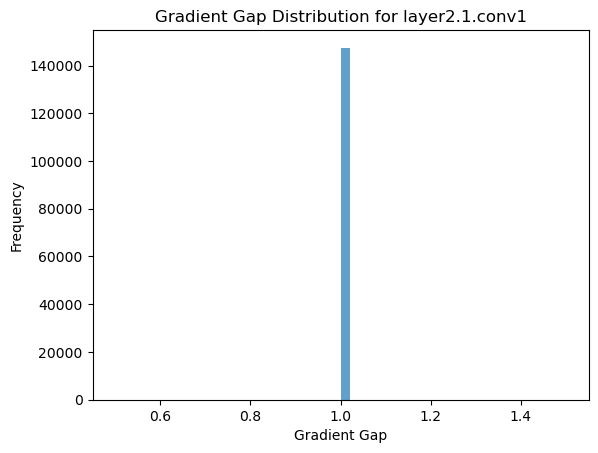

1.0


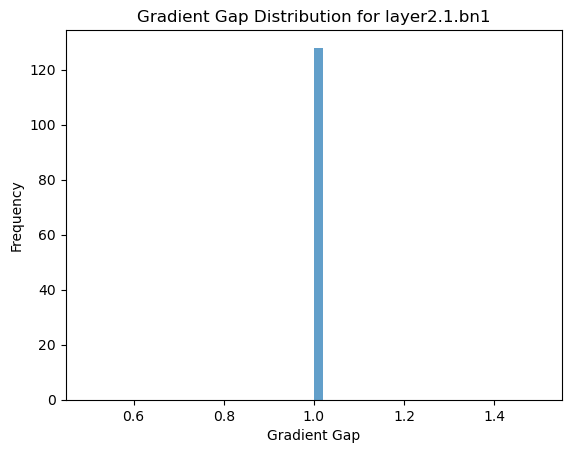

1.0


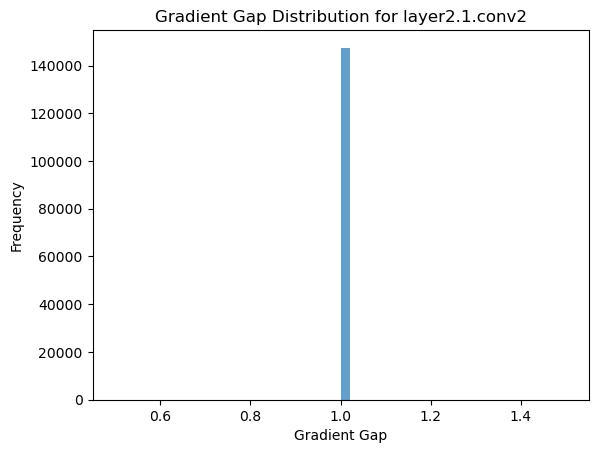

1.0


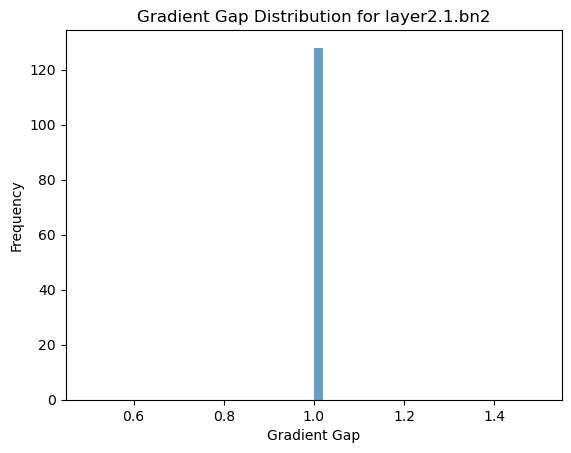

1.0


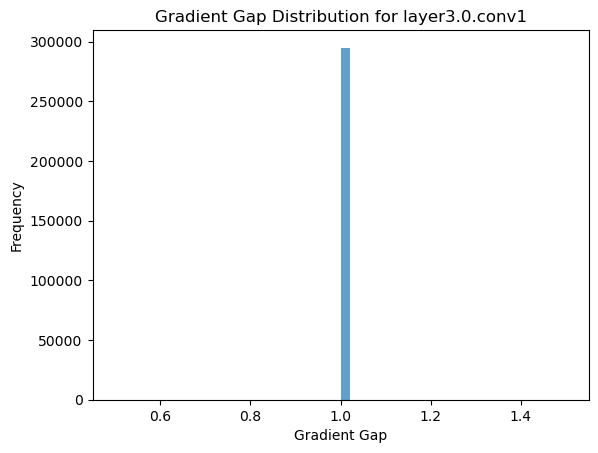

1.0


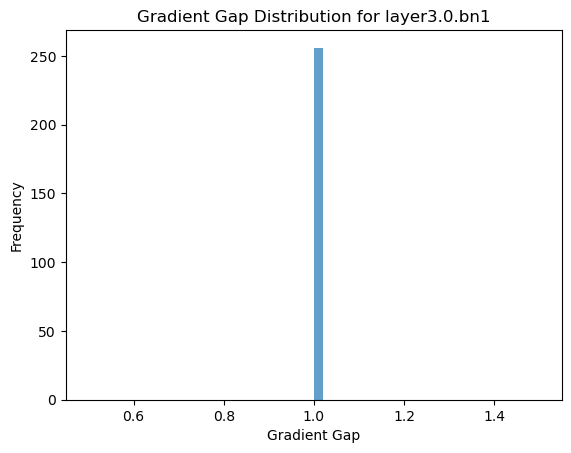

1.0


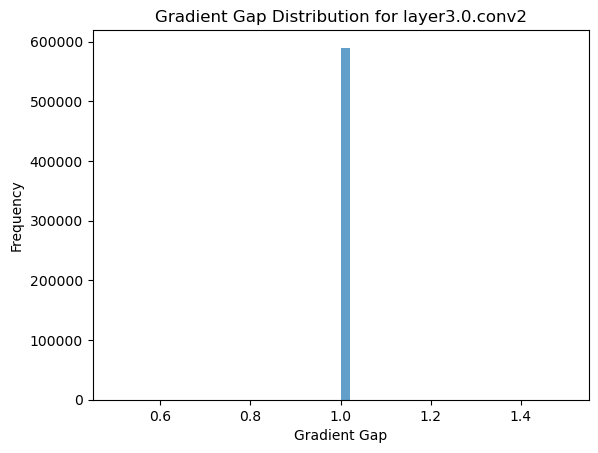

1.0


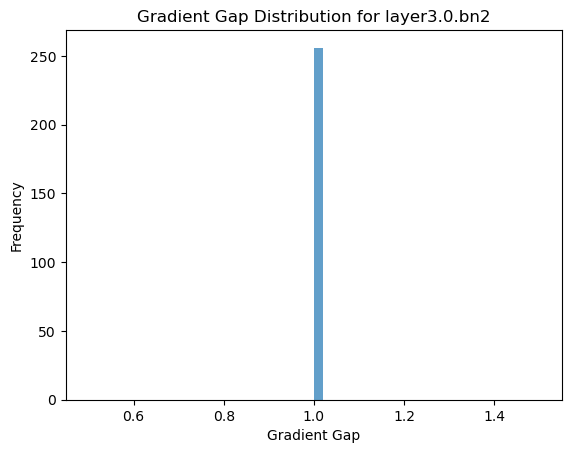

1.0


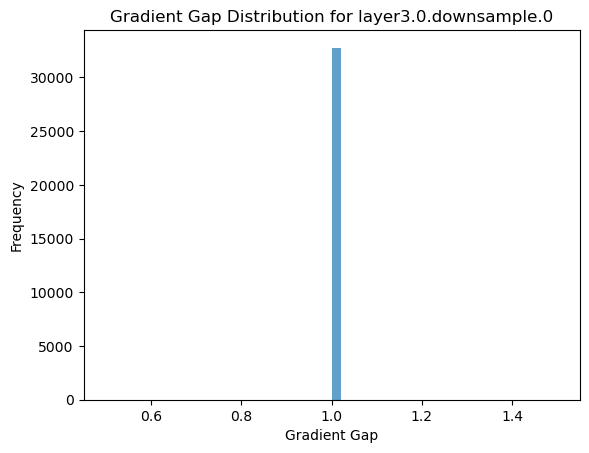

1.0


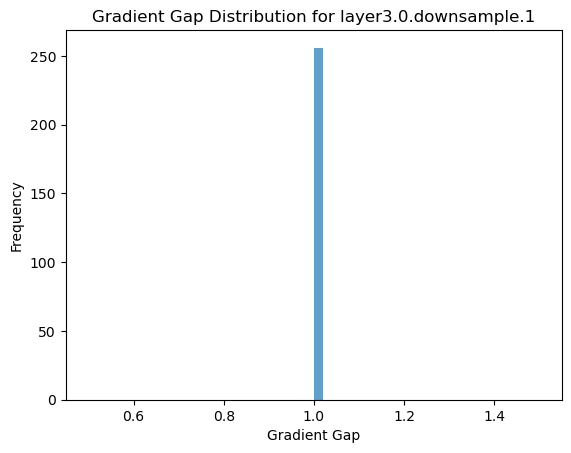

1.0


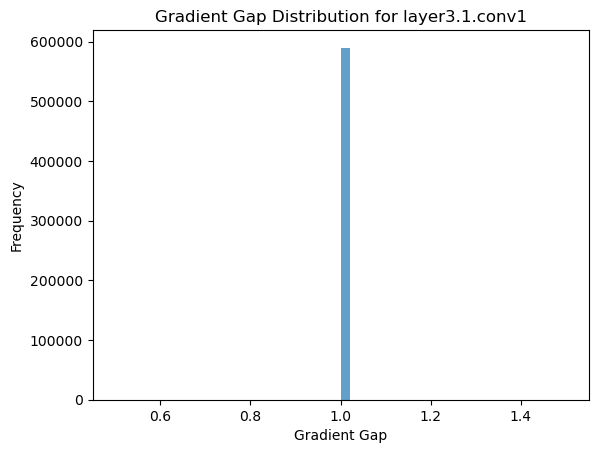

1.0


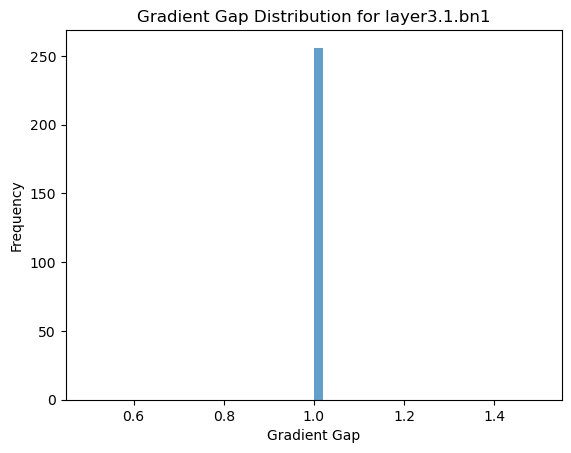

1.0


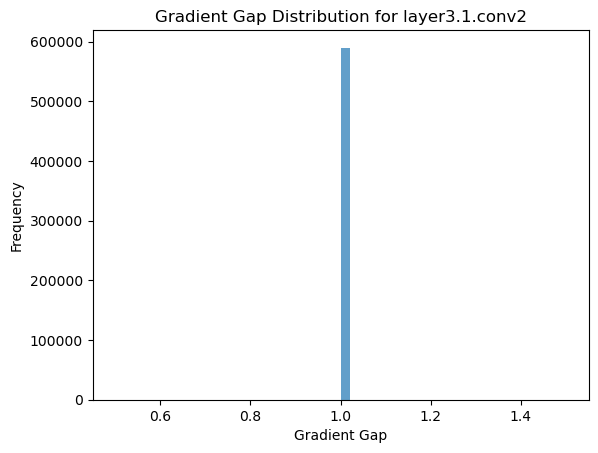

1.0


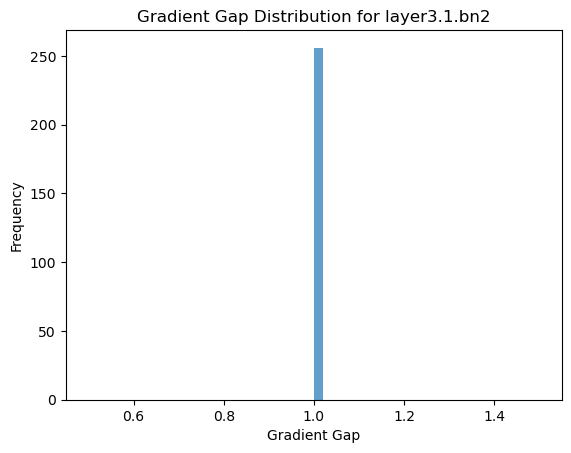

1.0


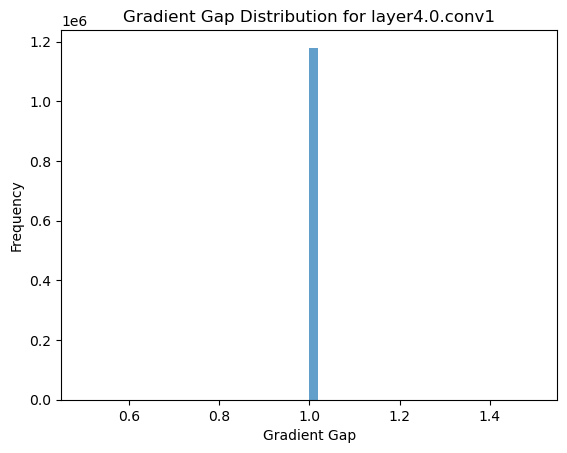

1.0


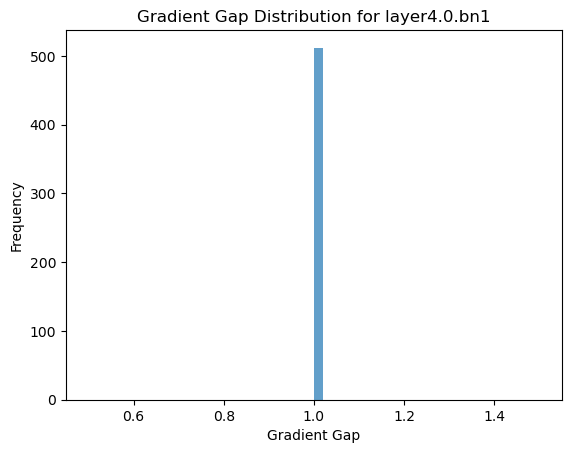

1.0


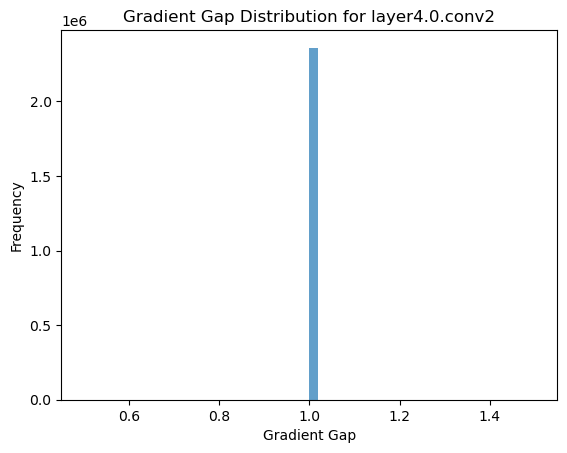

1.0


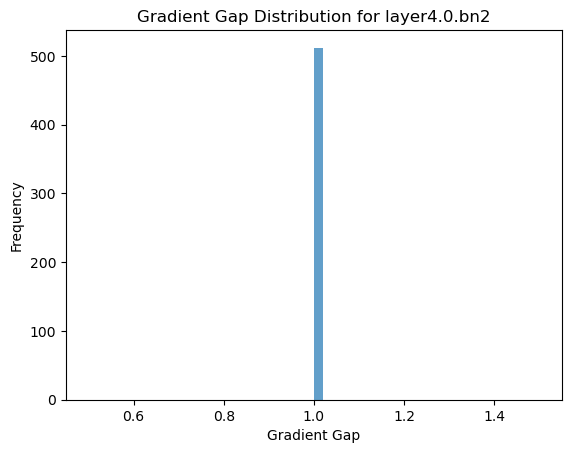

1.0


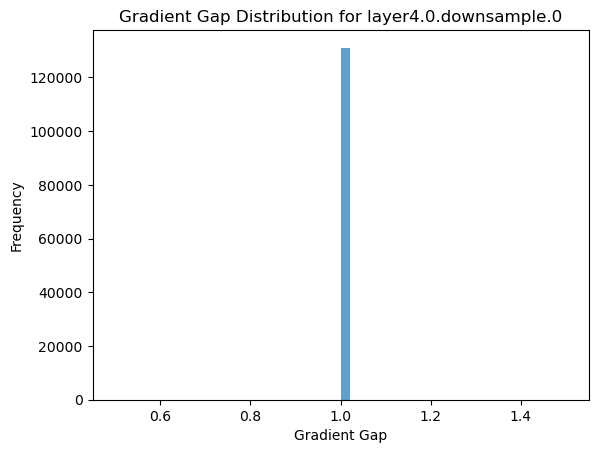

1.0


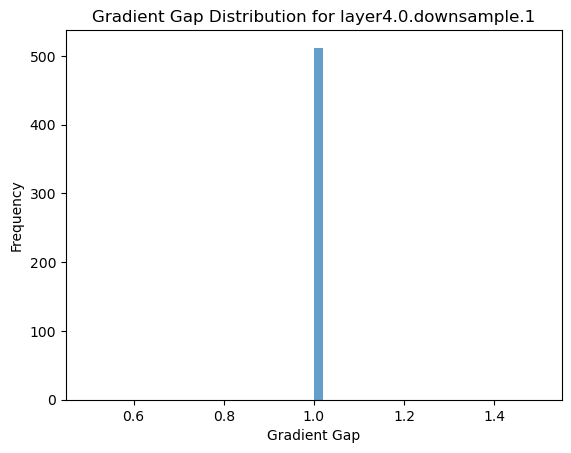

1.0


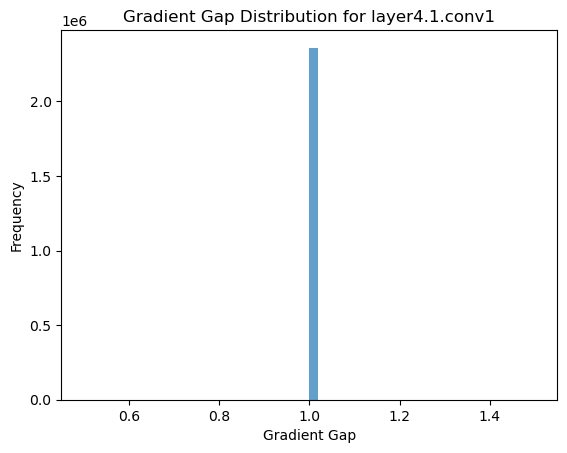

1.0


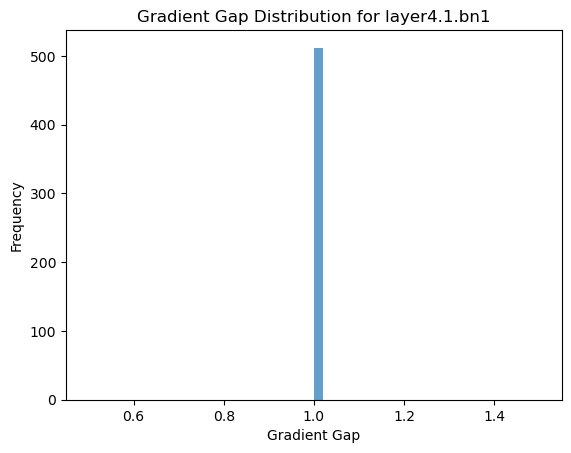

1.0


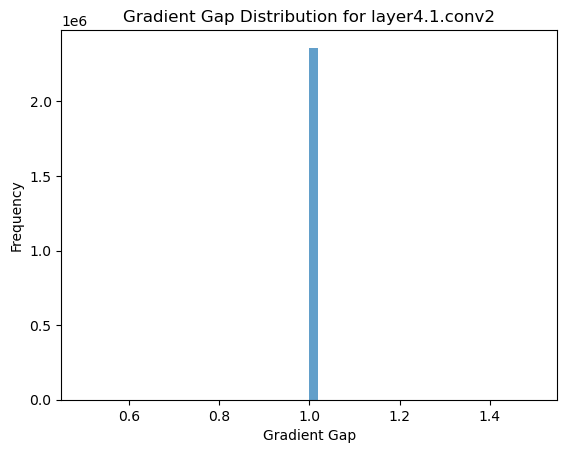

1.0


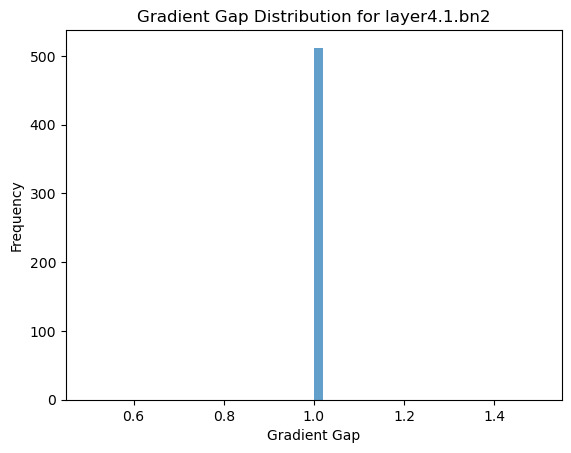

1.0


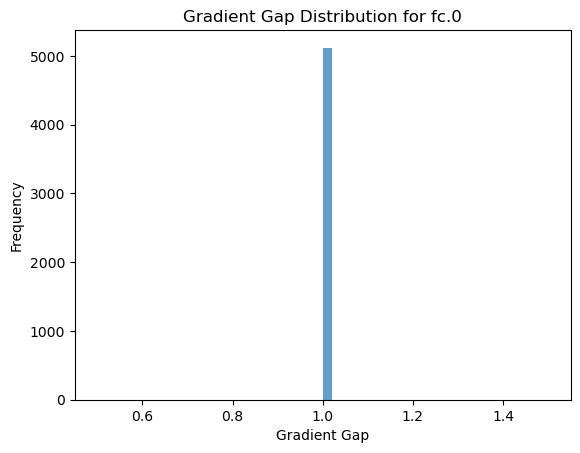

In [38]:
loaded_grad_gaps = torch.load('/data/home/huq/MLHospital/log_distribution/adaptive_regs/adaptive_regs_20_10.pth')

for name, grad_gap in loaded_grad_gaps.items():
    grad_gap_values = grad_gap.cpu().numpy().flatten()/1e-5  # 转为 numpy 数组并展平
    print(grad_gap_values.mean())
    plt.hist(grad_gap_values, bins=50, alpha=0.7)
    plt.title(f'Gradient Gap Distribution for {name}')
    plt.xlabel('Gradient Gap')
    plt.ylabel('Frequency')
    plt.show()

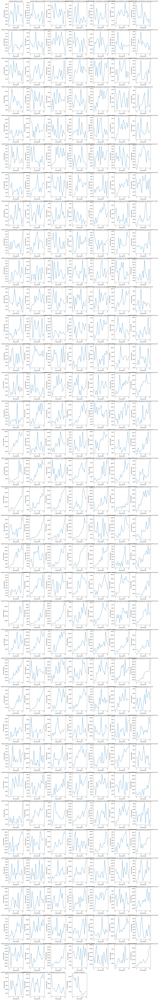

In [6]:
grad_gaps_all_epoch={}
for i in range(1,21):
    for j in range(1,2):
        loaded_grad_gaps = torch.load(f'/data/home/huq/MLHospital/log_distribution/adaptive_regs/adaptive_regs_{i}_{j}.pth')
        # loaded_grad_gaps = torch.load(f'/data/home/huq/MLHospital/log_distribution/grad_gaps_70100/grad_gaps_{i}_{j}.pth')
        # print(loaded_grad_gaps)
        for name, grad_gap in loaded_grad_gaps.items():
            grad_gap_values = grad_gap.cpu().numpy().flatten()/1e-5  # 转为 numpy 数组并展平
            # grad_gap_values = grad_gap.cpu().numpy().flatten()  # 转为 numpy 数组并展平
            if name not in grad_gaps_all_epoch.keys():
                grad_gaps_all_epoch[name]=[grad_gap_values.max()]
                # print(0)
            else:
                # print(1)
                grad_gaps_all_epoch[name].append(grad_gap_values.max())

# for name, grad_gap in grad_gaps_all_epoch.items():
#     # grad_gap_values = grad_gap.cpu().numpy().flatten()  # 转为 numpy 数组并展平
#     # print(grad_gap_values.mean())
#     plt.plot(grad_gap)
#     plt.title(f'Gradient Gap Variation for {name}')
#     plt.xlabel('reg progress')
#     plt.ylabel('mean grad gap')
#     plt.show()

num_plots = len(grad_gaps_all_epoch)
cols = 7  # 每行的列数
rows = 40  # 每列的行数

plt.figure(figsize=(21, rows * 4))  # 调整图形的尺寸，确保每个子图有足够的空间

for i, (name, grad_gap) in enumerate(grad_gaps_all_epoch.items()):
    plt.subplot(rows, cols, i + 1)  # 在网格中创建子图
    plt.plot(grad_gap)
    plt.title(f'{name}')
    plt.xlabel('reg progress')
    plt.ylabel('mean grad gap')

plt.tight_layout()  # 调整子图布局，使其在图形区域内适应
plt.show()

0.027846755


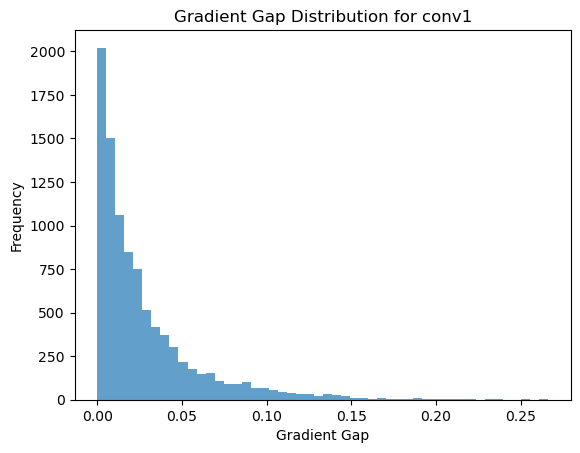

0.048470907


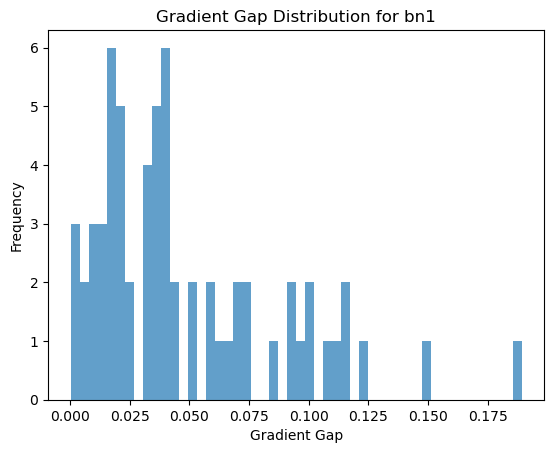

0.013339991


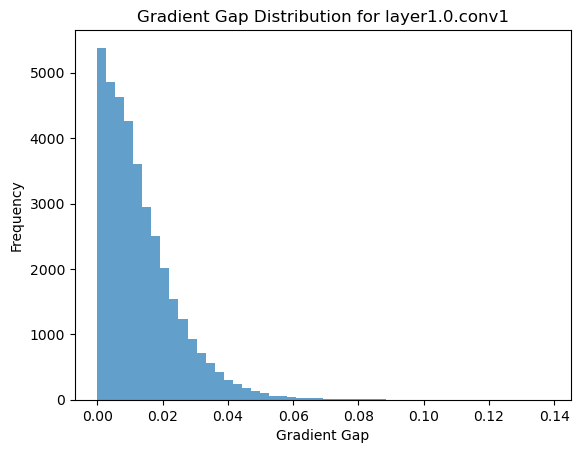

0.039855443


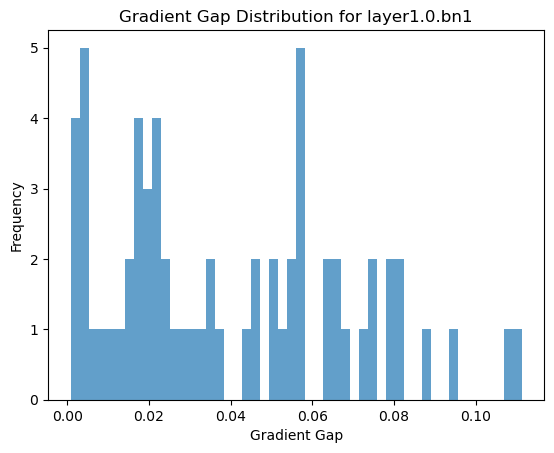

0.013866064


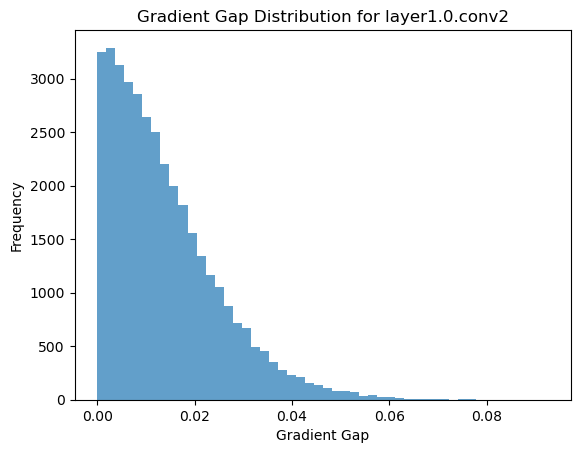

0.026799431


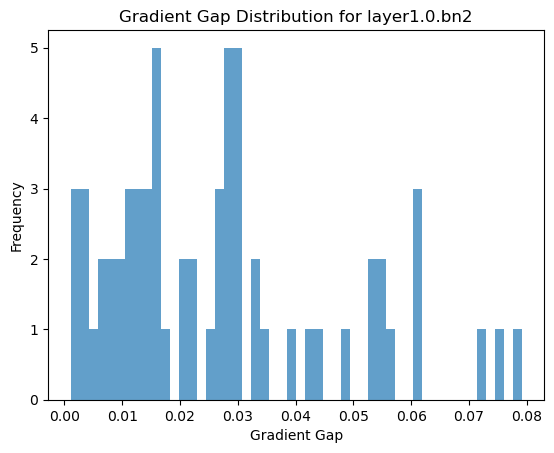

0.012208119


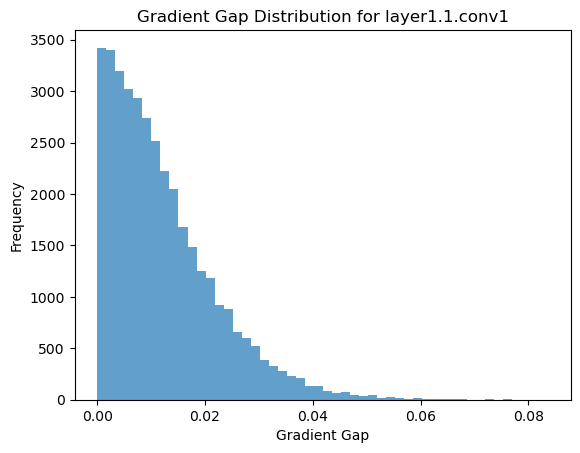

0.02362201


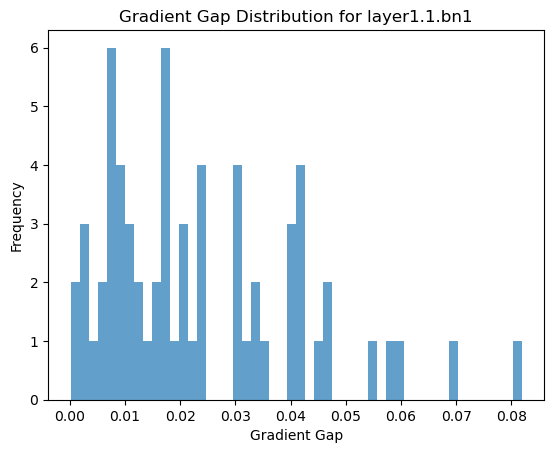

0.011723113


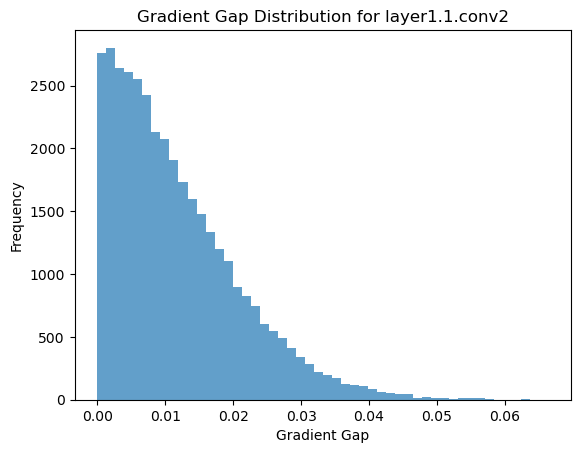

0.026255481


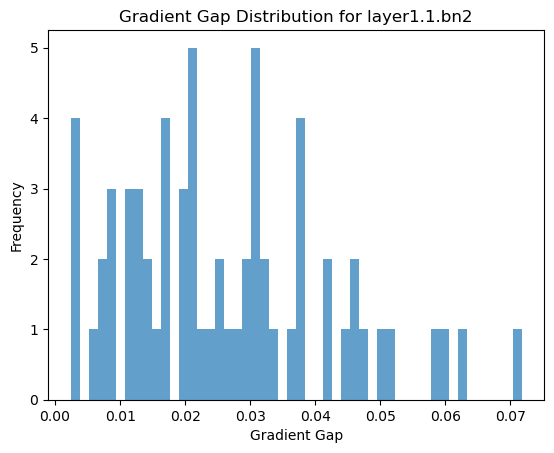

0.010411169


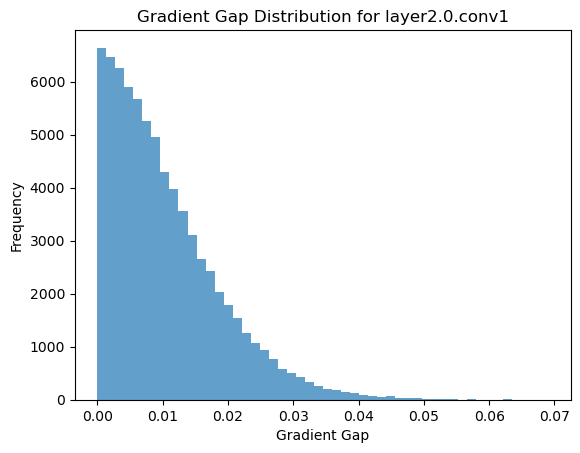

0.0143819675


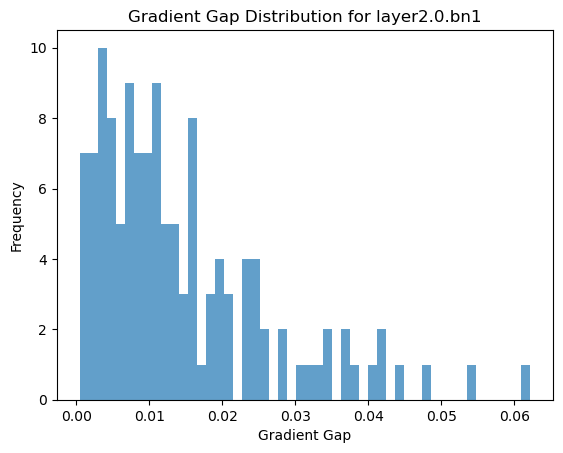

0.008605426


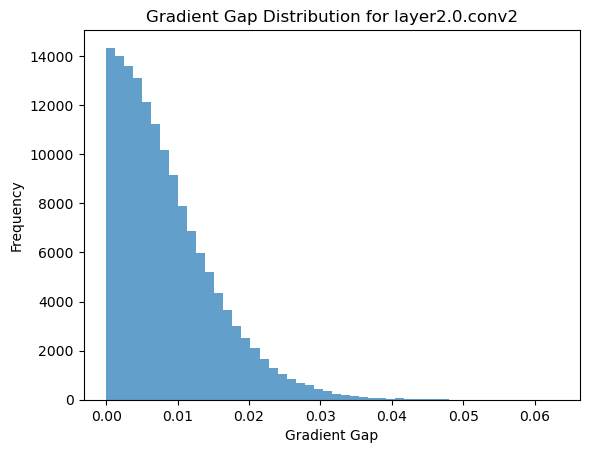

0.016313247


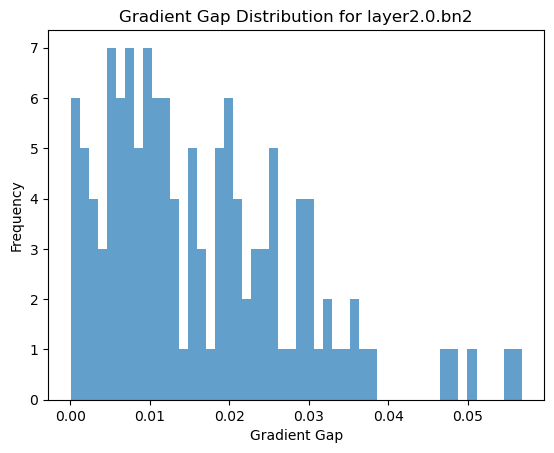

0.014341395


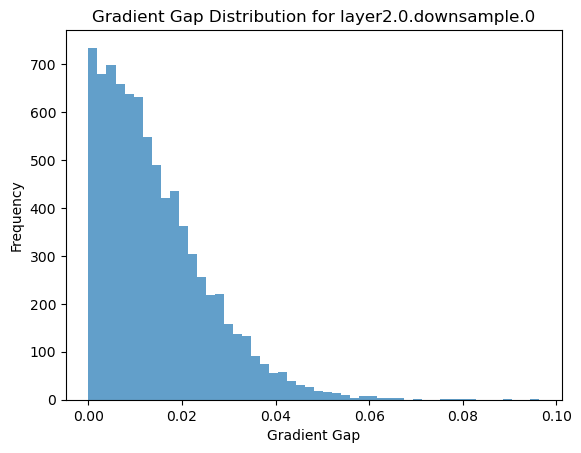

0.017490495


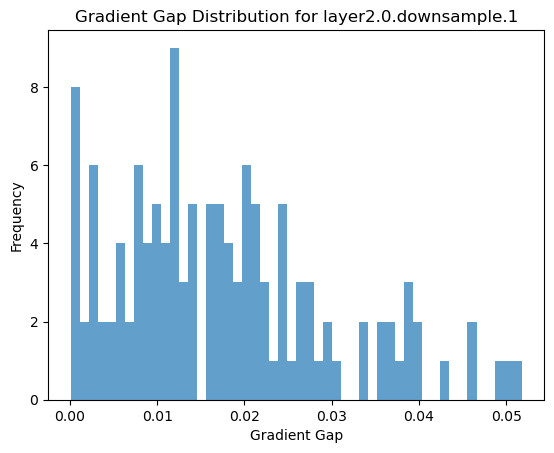

0.008687956


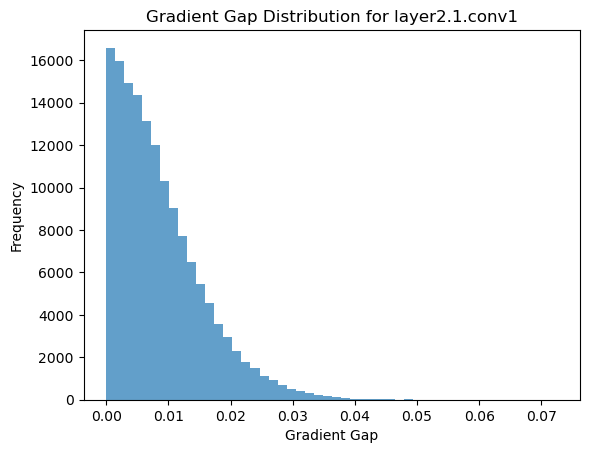

0.013925835


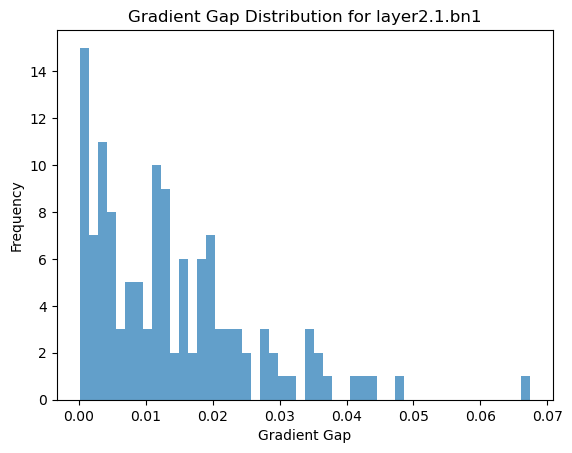

0.008268847


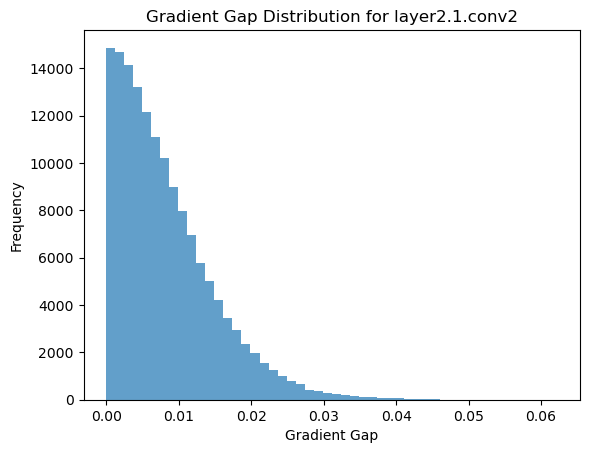

0.0130783


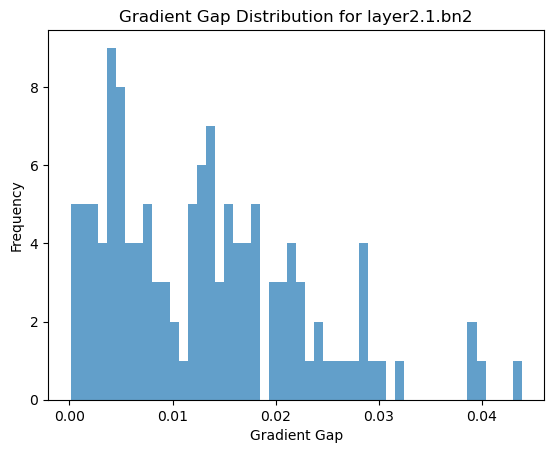

0.007437378


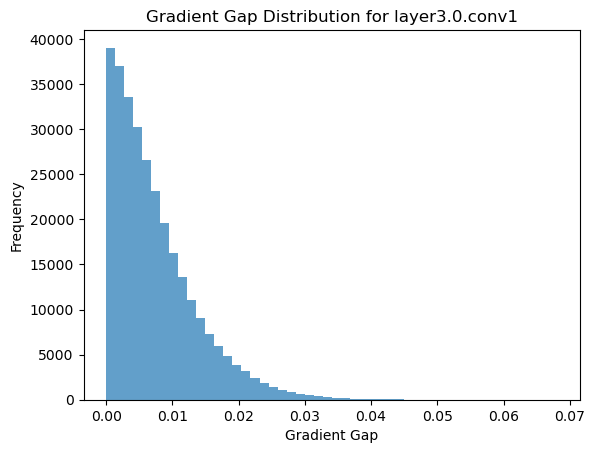

0.009453746


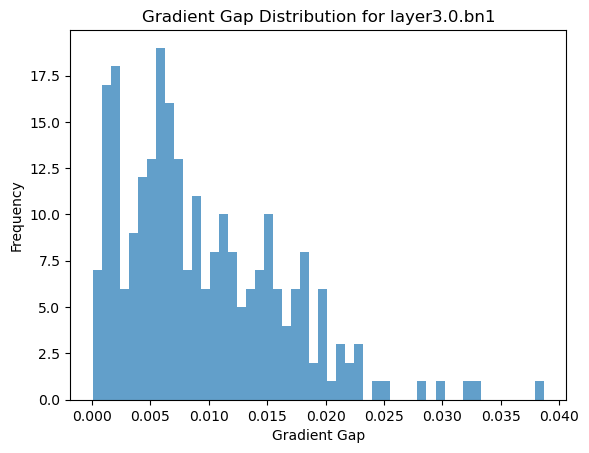

0.004627678


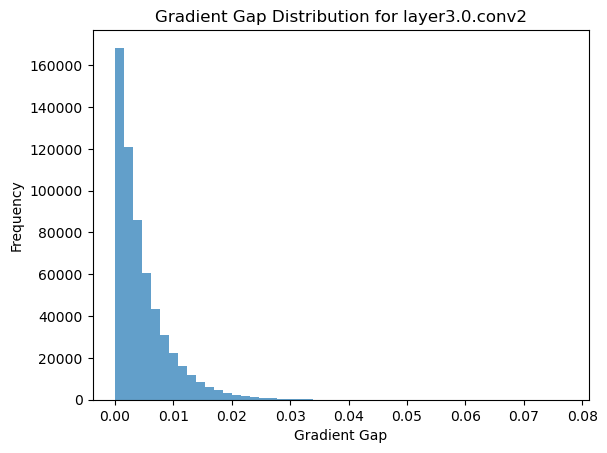

0.008895116


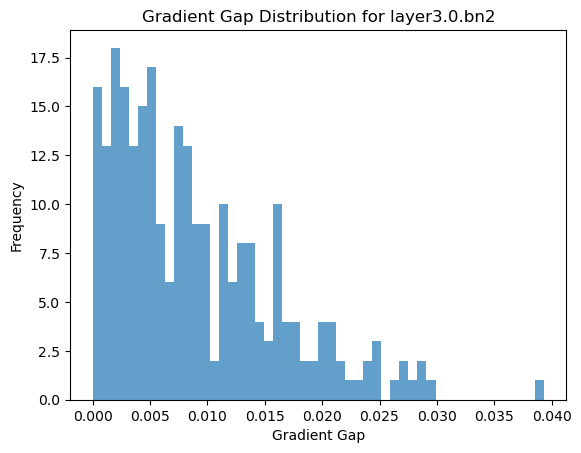

0.008492403


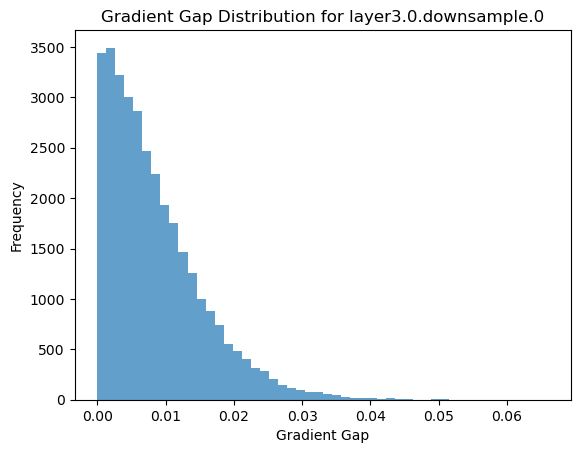

0.009143183


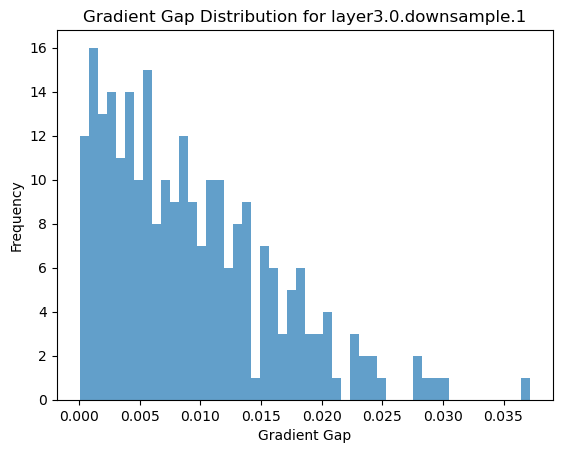

0.0037786684


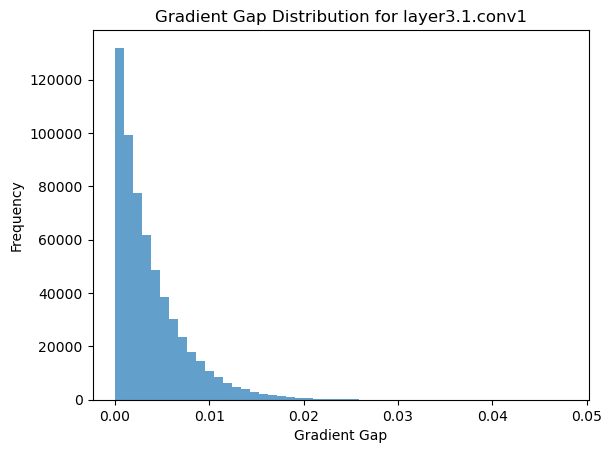

0.00590173


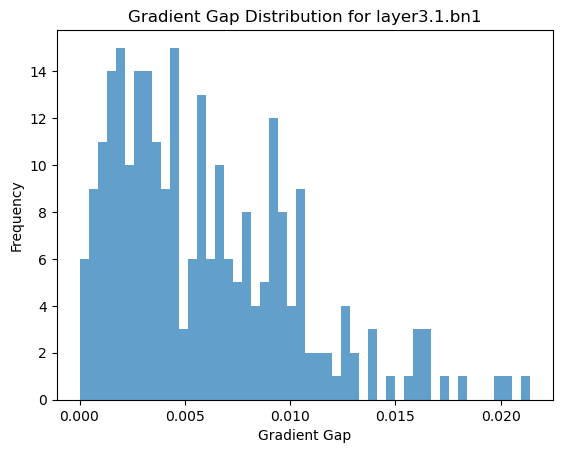

0.0030478179


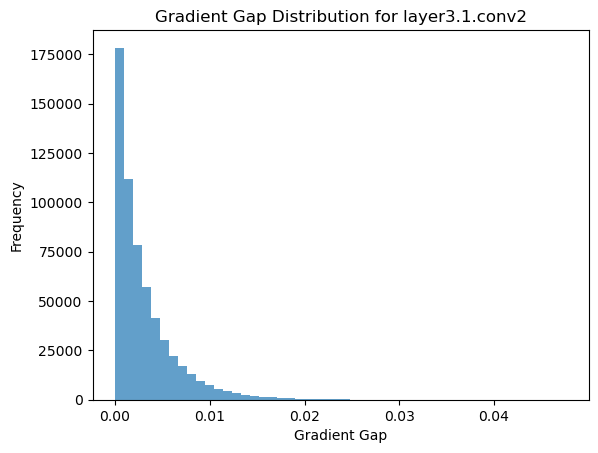

0.0052999435


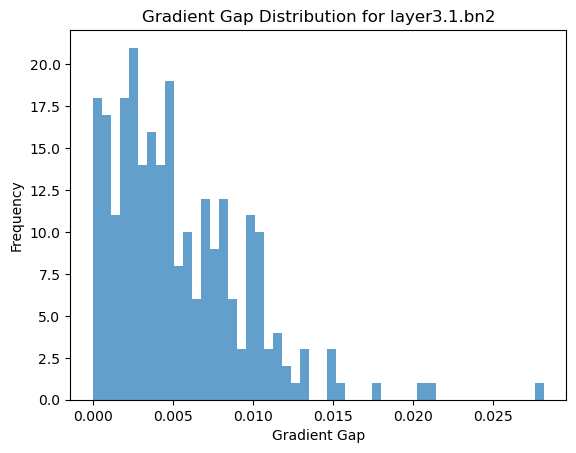

0.002161517


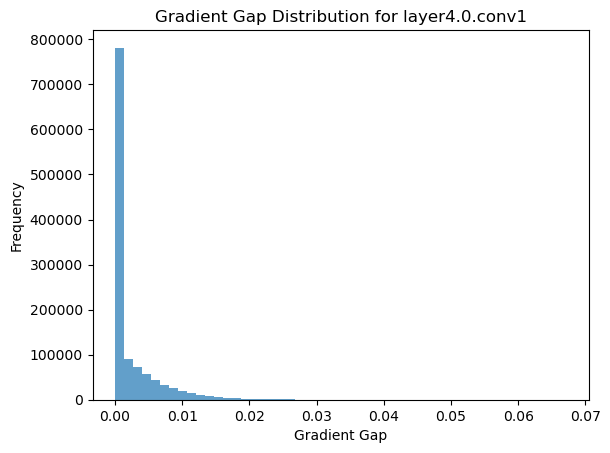

0.004338159


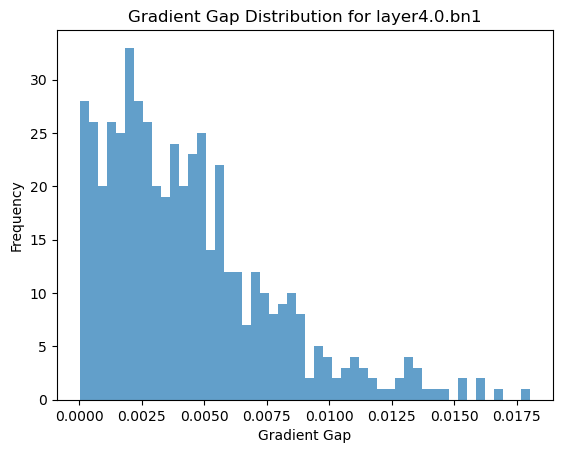

0.00068507675


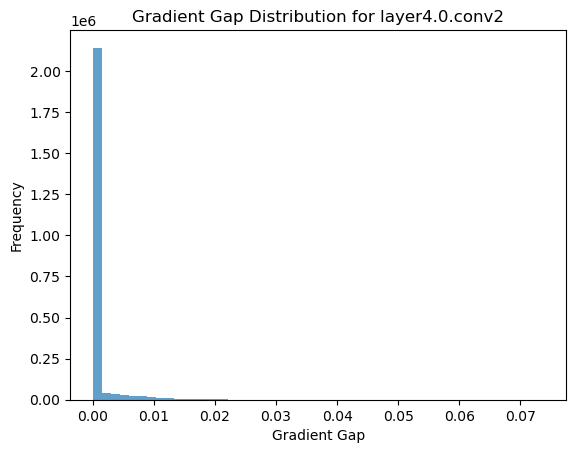

0.004830633


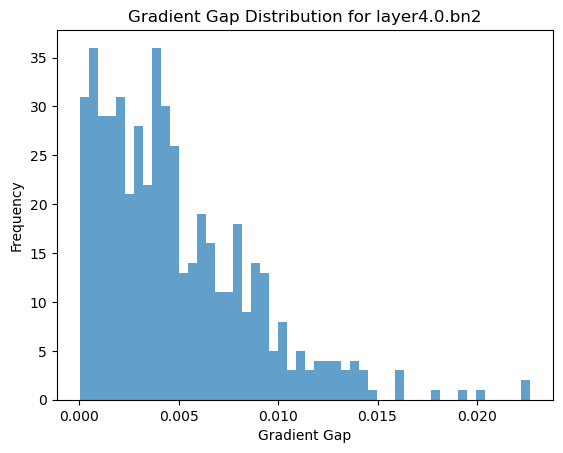

0.0037943274


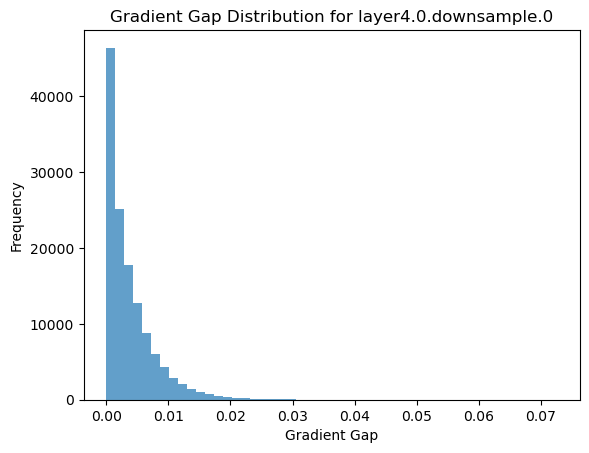

0.004470384


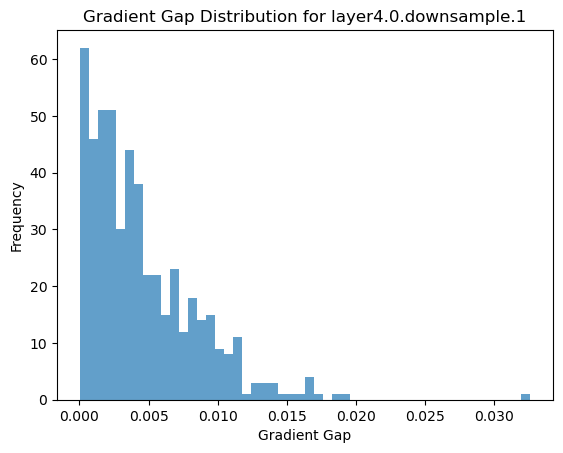

0.00056907855


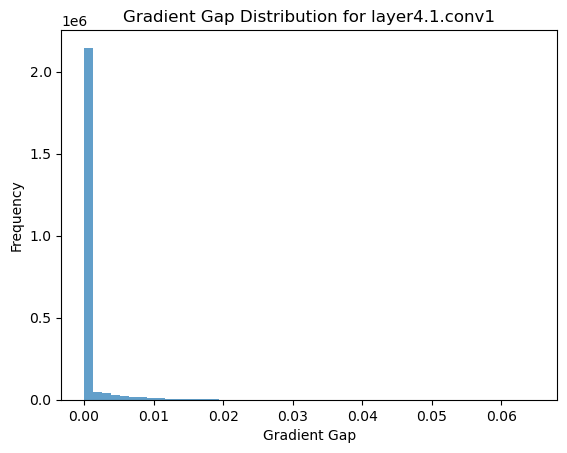

0.0027446332


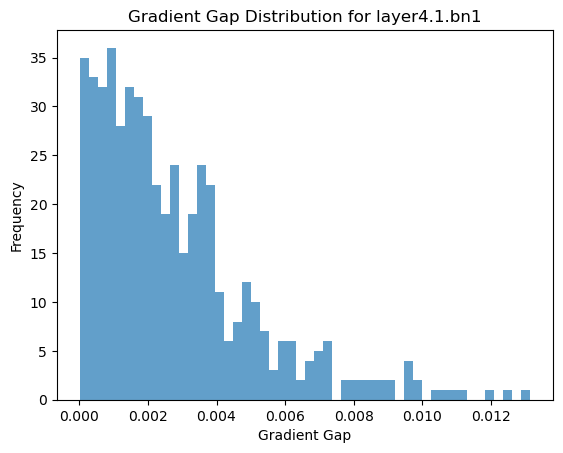

0.00039467908


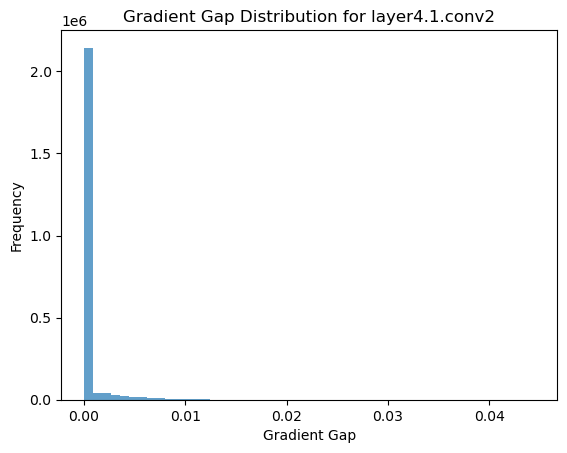

0.002858024


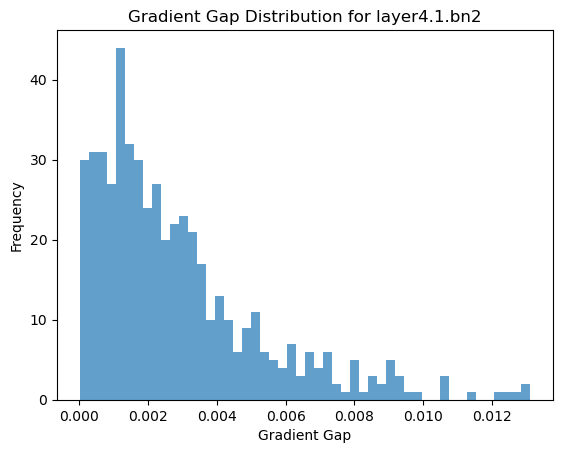

0.024326593


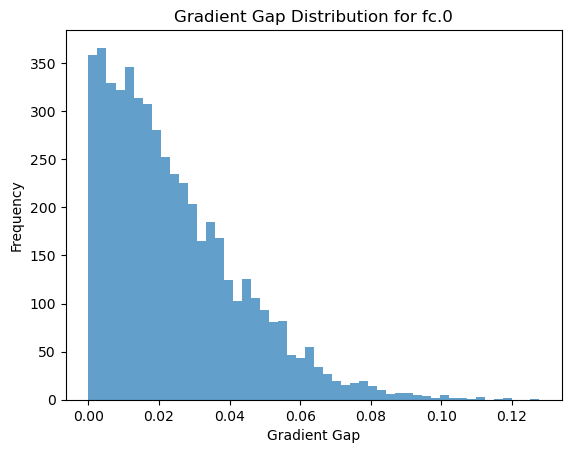

In [39]:
loaded_grad_gaps = torch.load('/data/home/huq/MLHospital/log_distribution/grad_gaps/grad_gaps_1_1.pth')

for name, grad_gap in loaded_grad_gaps.items():
    grad_gap_values = grad_gap.cpu().numpy().flatten()  # 转为 numpy 数组并展平
    print(grad_gap_values.mean())
    plt.hist(grad_gap_values, bins=50, alpha=0.7)
    plt.title(f'Gradient Gap Distribution for {name}')
    plt.xlabel('Gradient Gap')
    plt.ylabel('Frequency')
    plt.show()

0.015689723


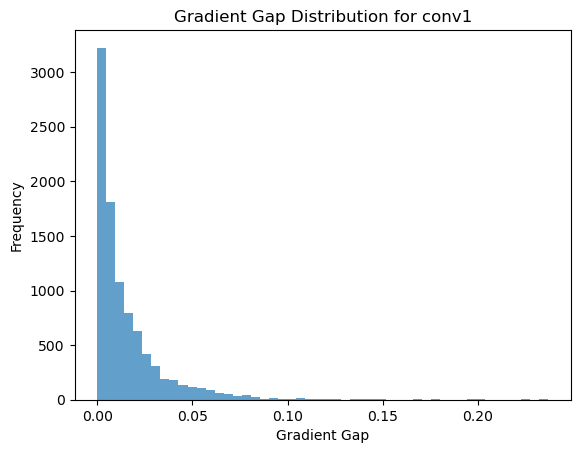

0.022477048


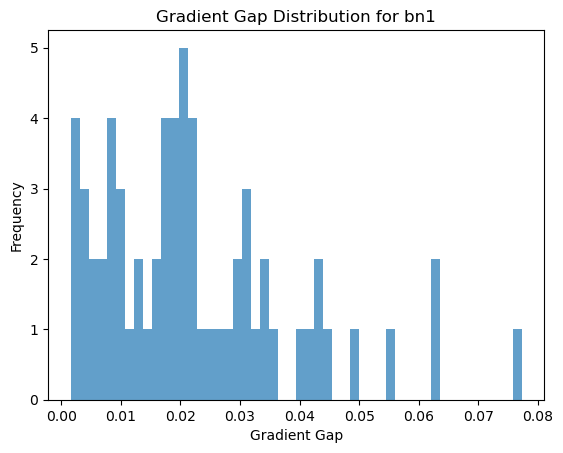

0.0068193595


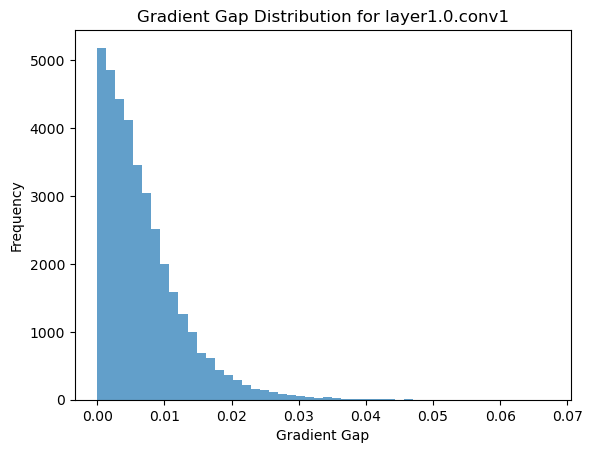

0.015614858


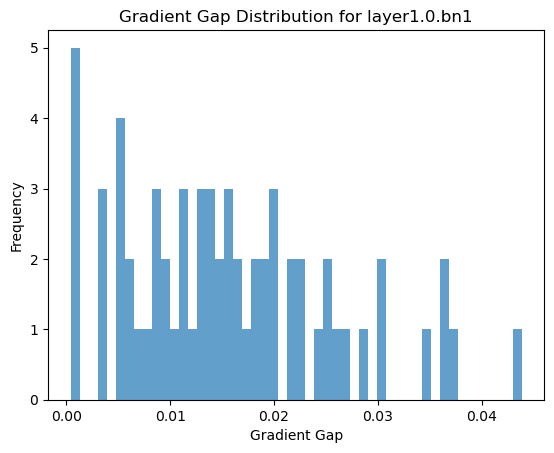

0.0065169893


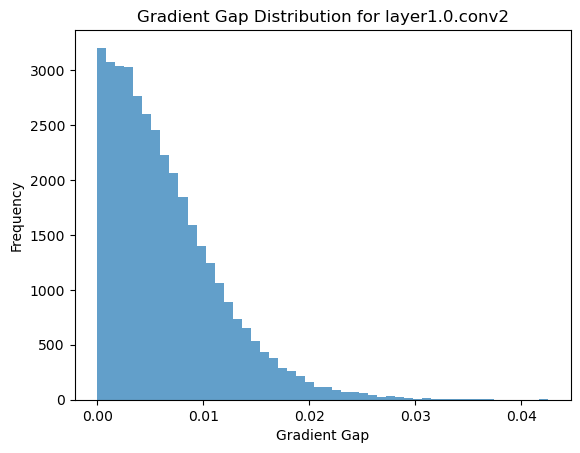

0.017108217


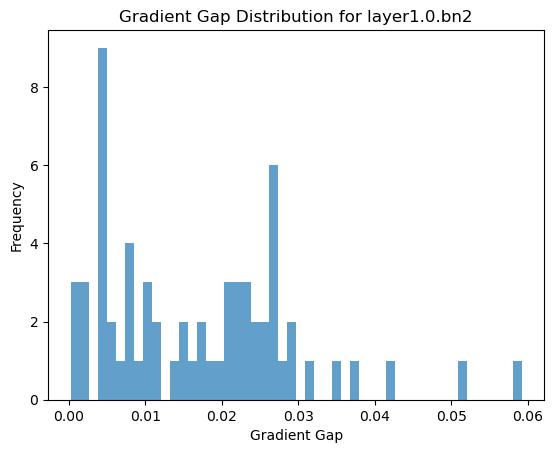

0.0058821654


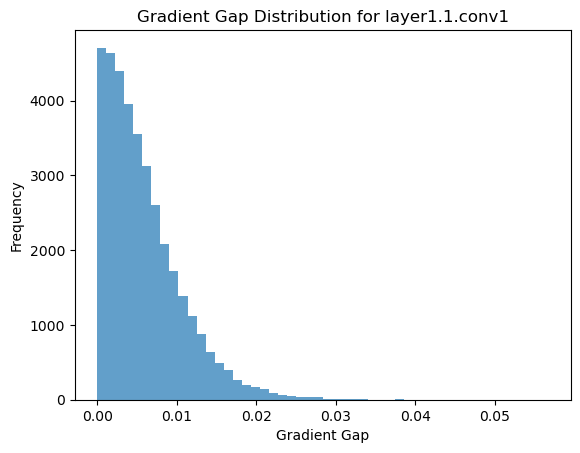

0.0132981185


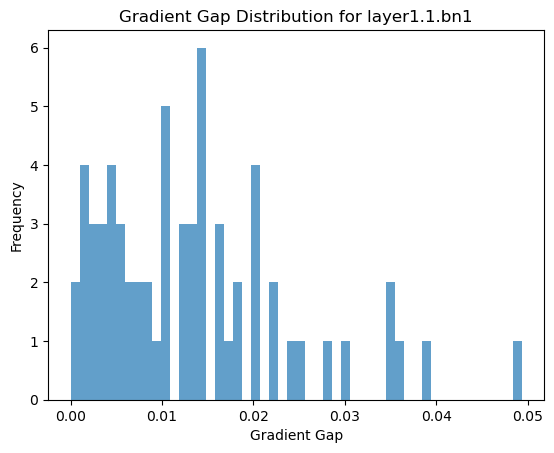

0.0057322183


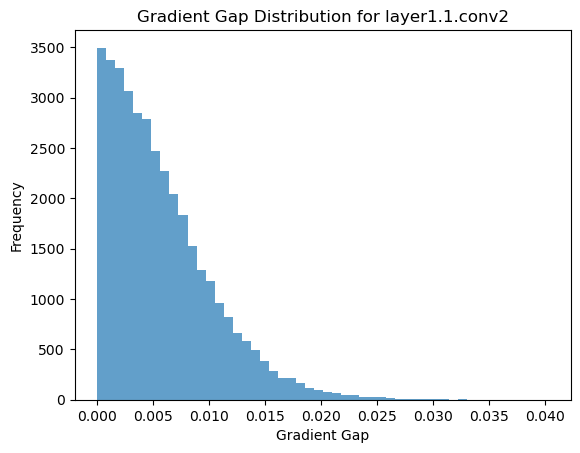

0.010404448


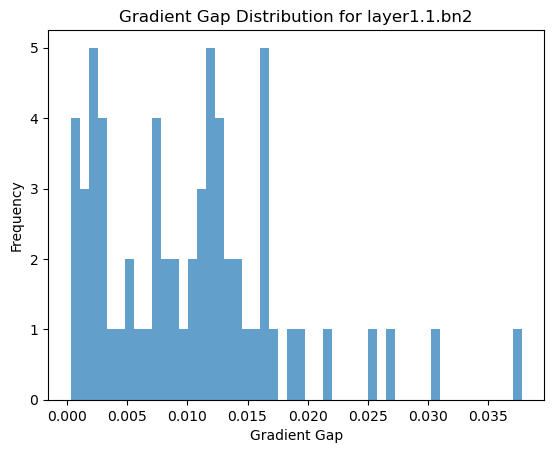

0.0053209513


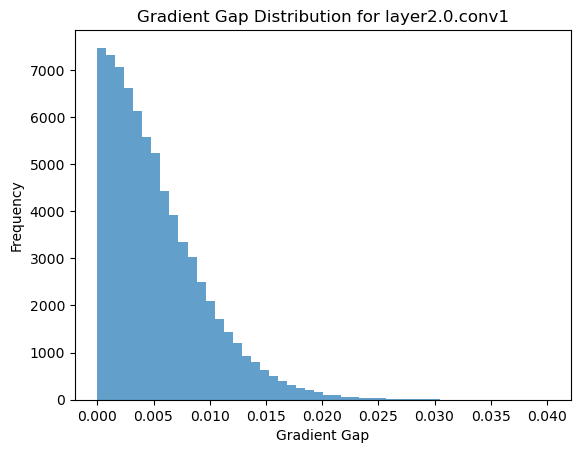

0.008503433


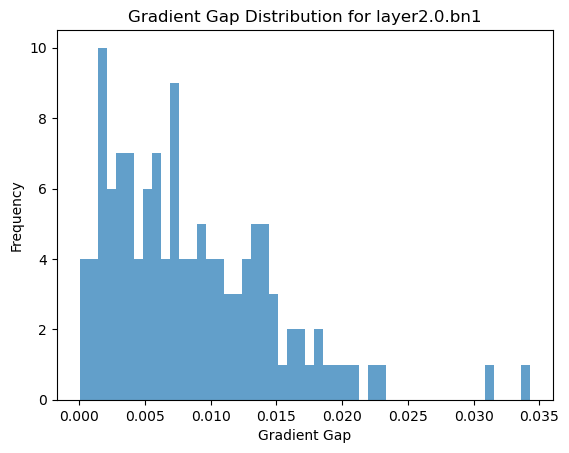

0.0043205507


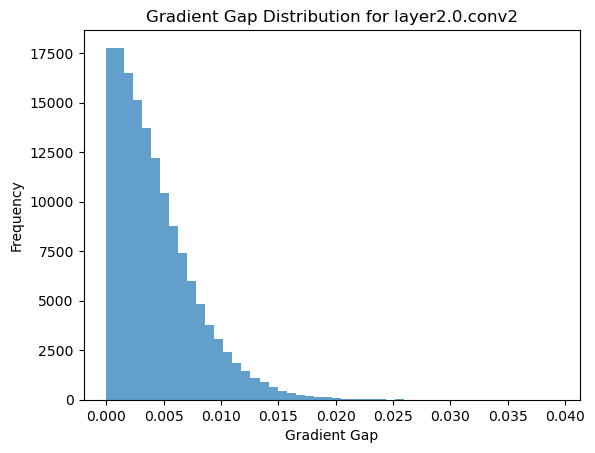

0.007986179


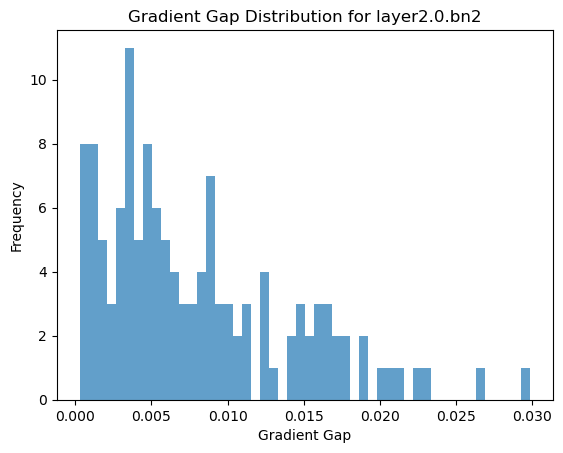

0.0073023243


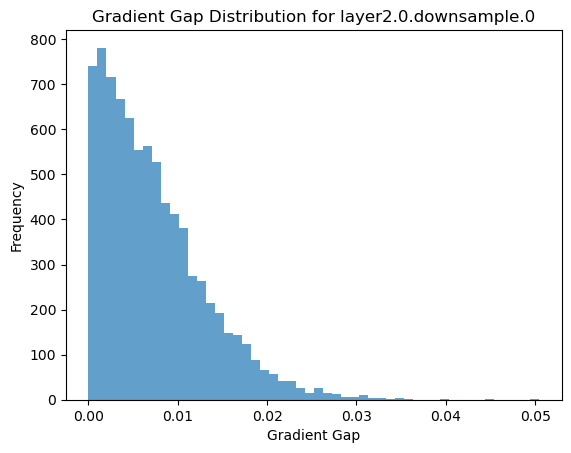

0.008114887


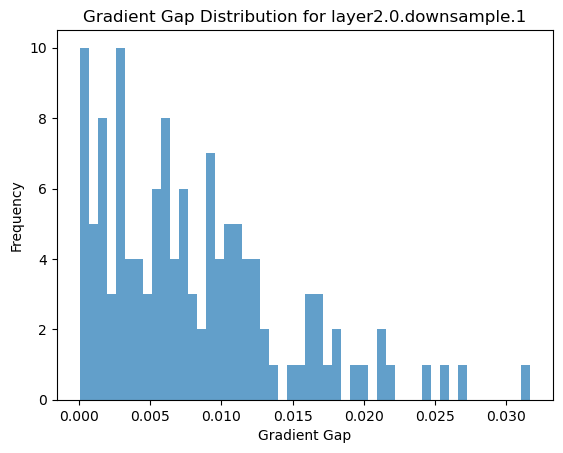

0.0045313053


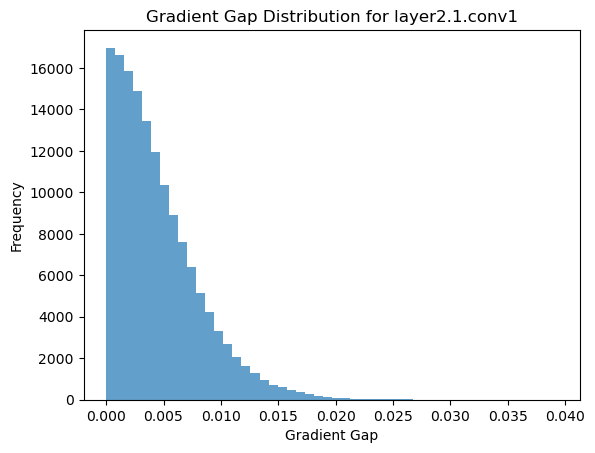

0.00806102


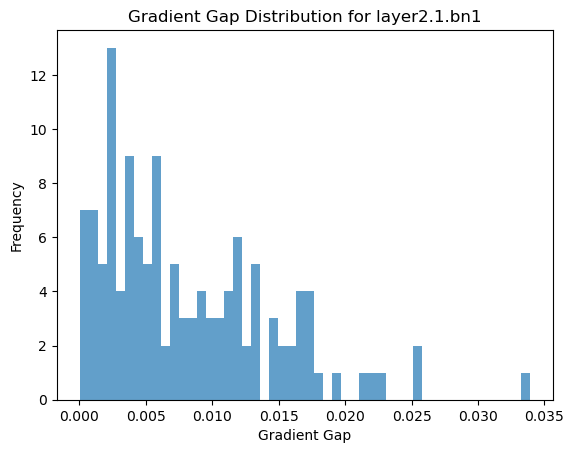

0.0042069284


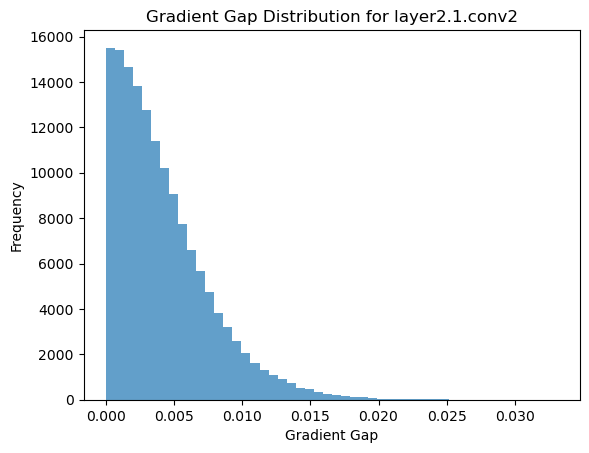

0.006774201


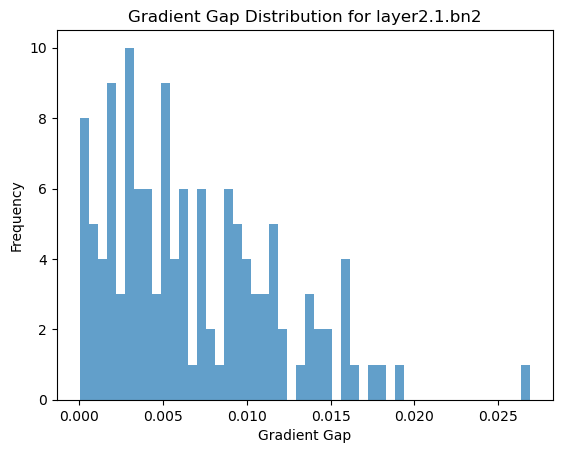

0.0037233713


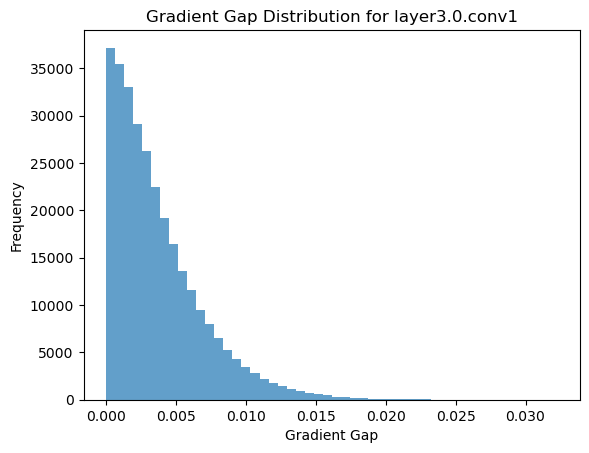

0.004934579


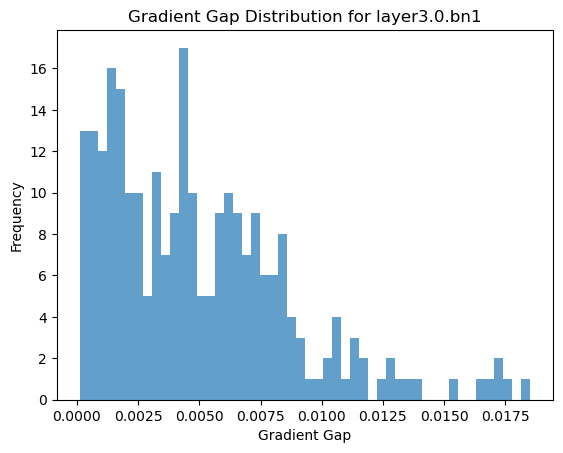

0.0029876856


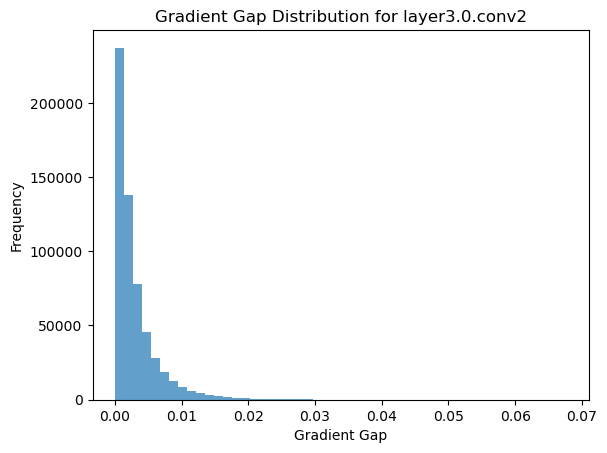

0.004301709


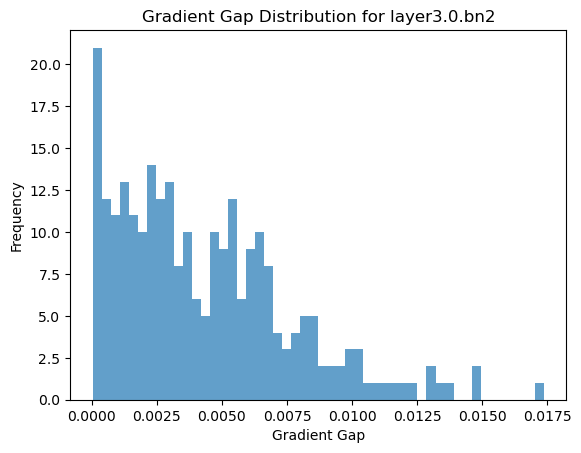

0.004183002


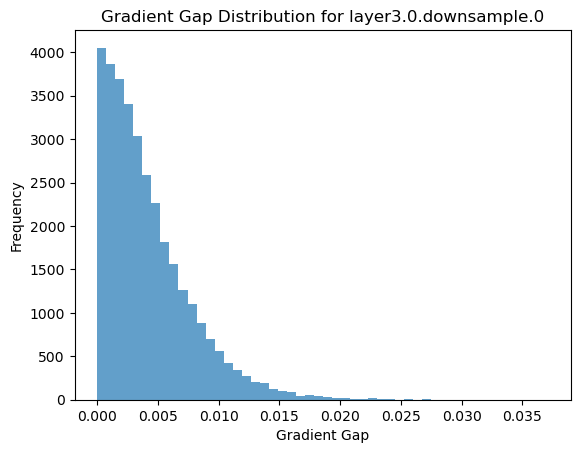

0.0042607347


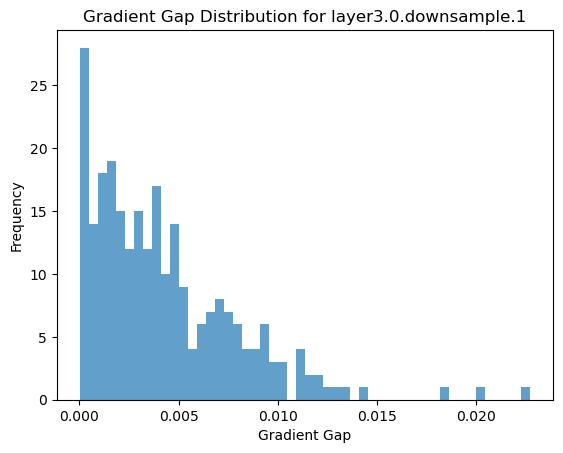

0.0022296451


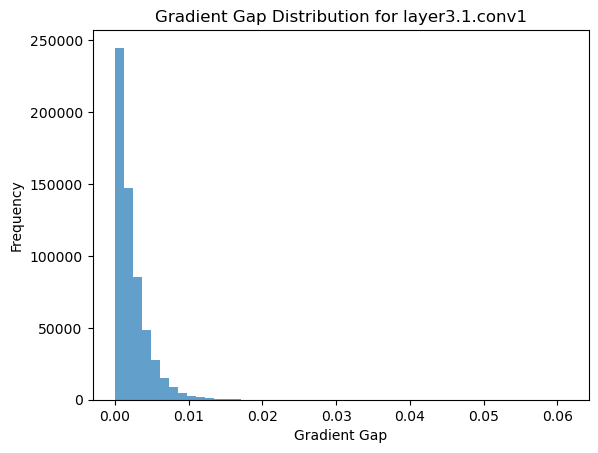

0.0031182775


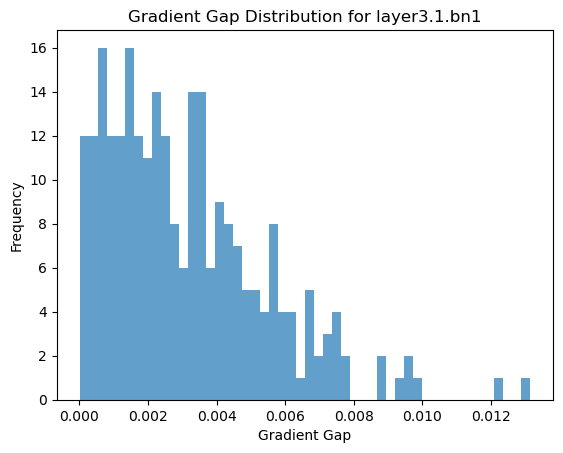

0.0028701732


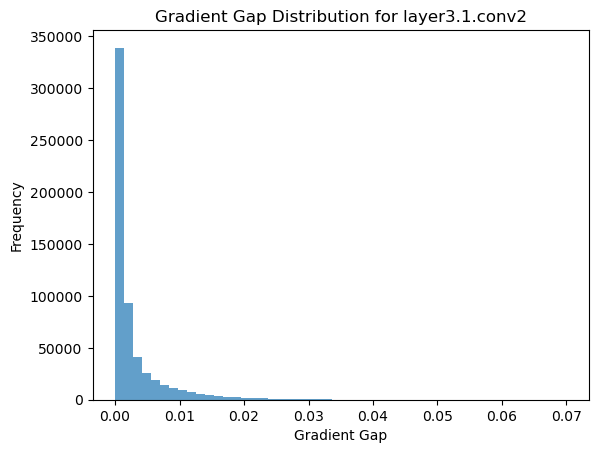

0.0024094954


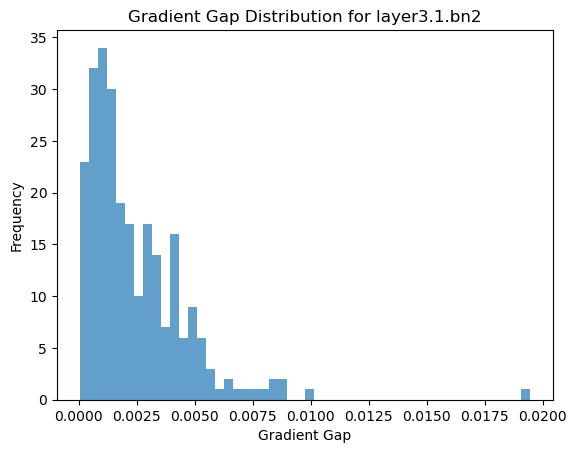

0.0033720764


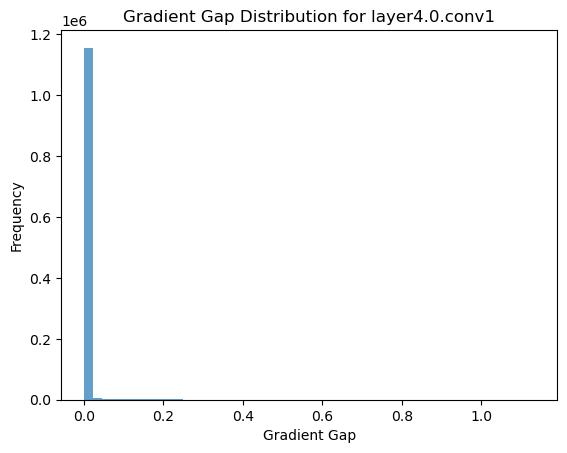

0.0006656953


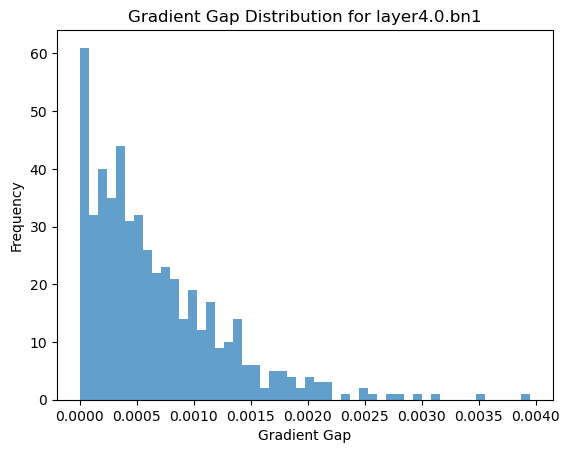

0.007502811


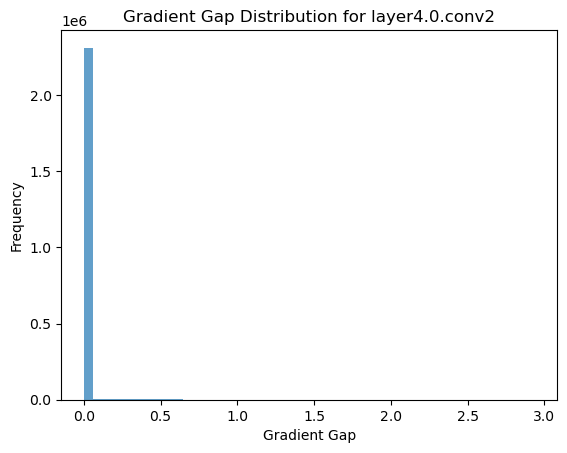

0.0010717717


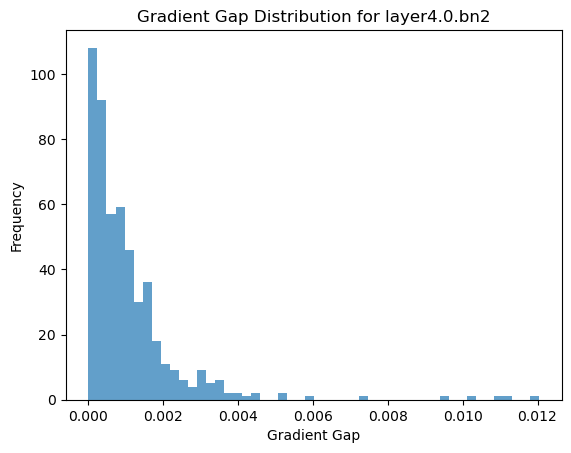

0.003411736


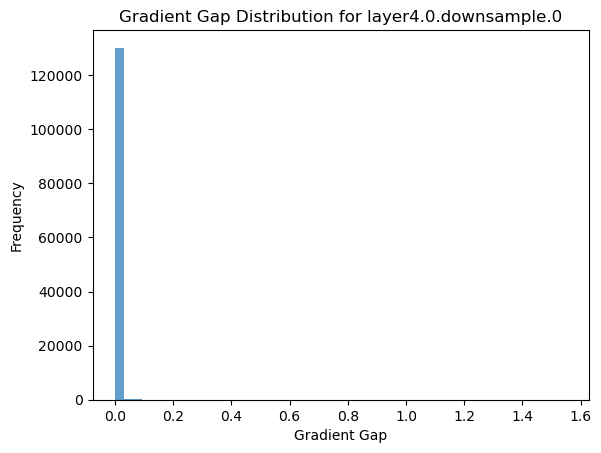

0.0027100074


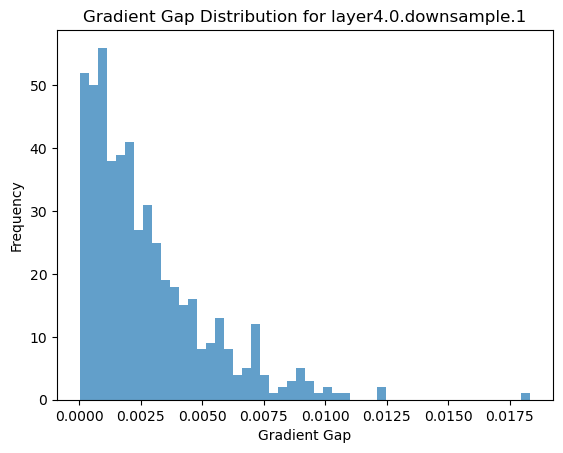

0.0015872692


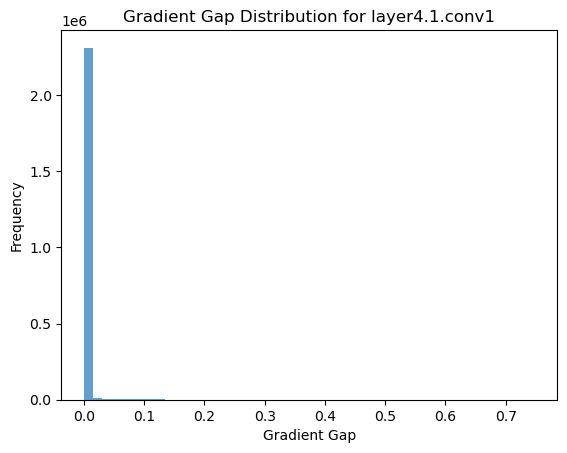

0.0013481007


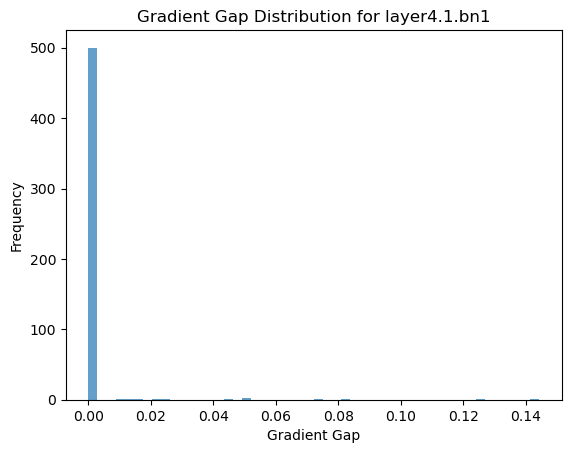

0.0009345614


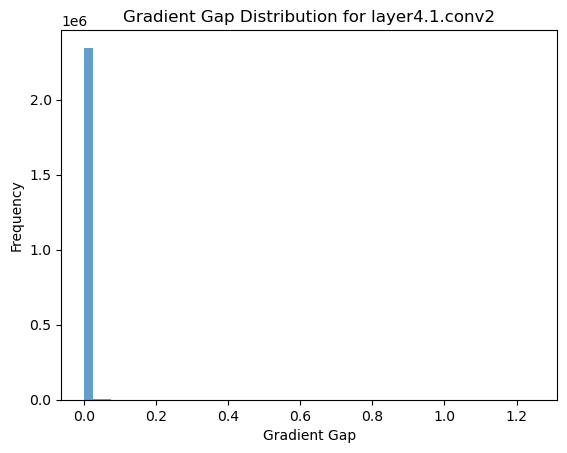

0.00065412716


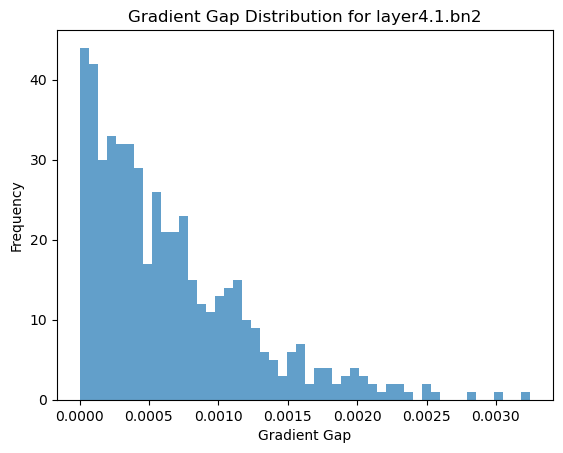

0.011185212


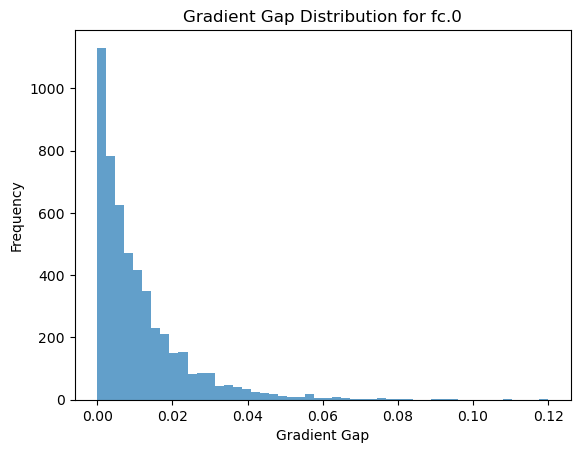

In [36]:
loaded_grad_gaps = torch.load('/data/home/huq/MLHospital/log_distribution/grad_gaps/grad_gaps_20_10.pth')

for name, grad_gap in loaded_grad_gaps.items():
    grad_gap_values = grad_gap.cpu().numpy().flatten()  # 转为 numpy 数组并展平
    print(grad_gap_values.mean())
    plt.hist(grad_gap_values, bins=50, alpha=0.7)
    plt.title(f'Gradient Gap Distribution for {name}')
    plt.xlabel('Gradient Gap')
    plt.ylabel('Frequency')
    plt.show()